In [12893]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [12894]:
np.random.seed(42)

In [12895]:
N_CLUSTER = 3

In [12896]:
CORRELATION = 0.1

In [12897]:
NOISE_STD = 12.5

In [12898]:
N_SAMPLE = 5000

In [12899]:
N_FEATURES = 10

In [12900]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[3.0, 2.0, 0.5],
                             separation_factor=4.0,
                             sample_distribution=[2500, 1250, 1250],
                             random_state=42)

In [12901]:
X.shape

(5000, 11)

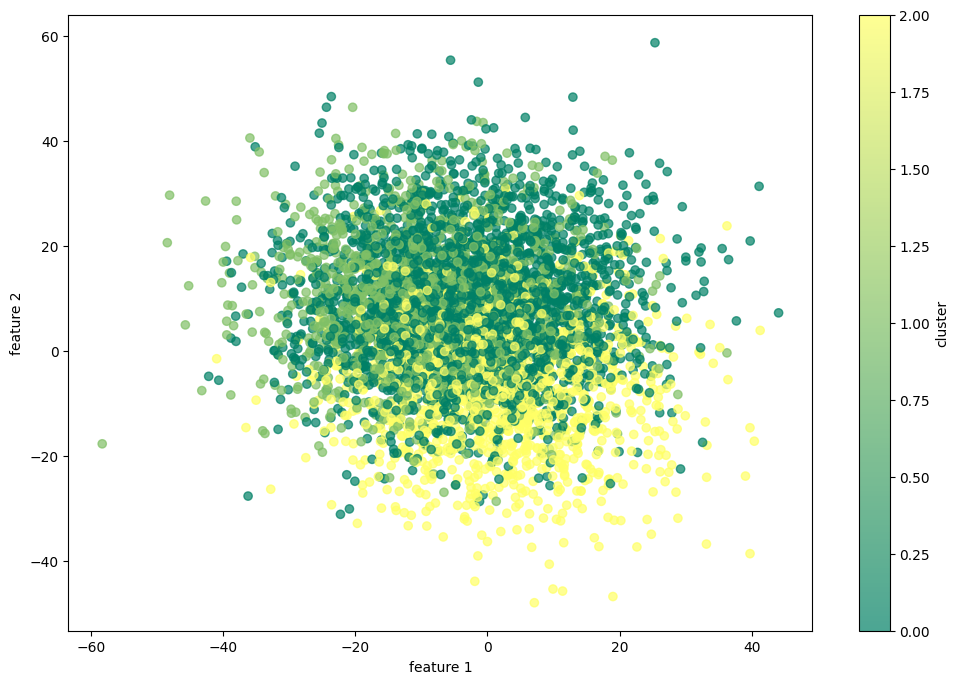

In [12902]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

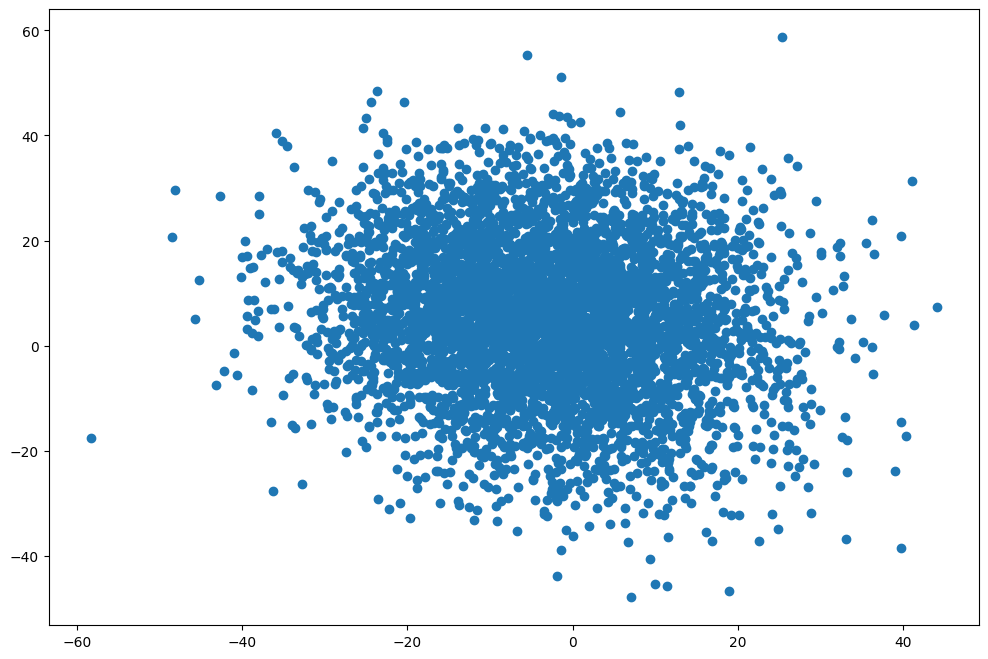

In [12903]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [12904]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [12905]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10
var_1,1.000000,-0.131364,-0.086222,0.034906,0.047026,0.084887,-0.006526,0.006113,0.031905,-0.037116
var_2,-0.131364,1.000000,0.152951,0.034952,-0.080062,-0.191723,-0.017607,0.063186,0.006753,0.160842
var_3,-0.086222,0.152951,1.000000,0.009843,-0.069726,-0.118653,-0.002169,0.024757,-0.003566,0.083503
var_4,0.034906,0.034952,0.009843,1.000000,-0.011390,-0.024211,-0.051386,0.073556,0.026054,0.069120
var_5,0.047026,-0.080062,-0.069726,-0.011390,1.000000,0.068631,0.028846,-0.041633,0.005116,-0.036027
var_6,0.084887,-0.191723,-0.118653,-0.024211,0.068631,1.000000,0.019794,-0.066582,-0.008864,-0.139310
var_7,-0.006526,-0.017607,-0.002169,-0.051386,0.028846,0.019794,1.000000,-0.059428,-0.016458,-0.078521
var_8,0.006113,0.063186,0.024757,0.073556,-0.041633,-0.066582,-0.059428,1.000000,0.027907,0.096693
var_9,0.031905,0.006753,-0.003566,0.026054,0.005116,-0.008864,-0.016458,0.027907,1.000000,0.011973
var_10,-0.037116,0.160842,0.083503,0.069120,-0.036027,-0.139310,-0.078521,0.096693,0.011973,1.000000


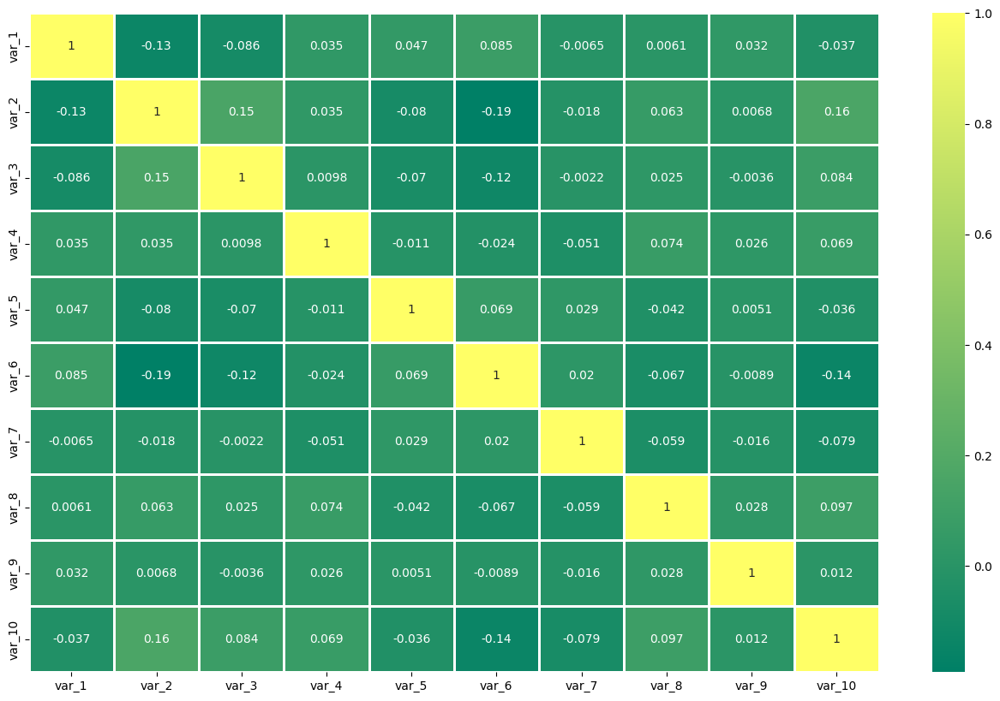

In [12906]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

## data standardization

In [12907]:
X_values = corr_dataset.iloc[:,:-1].values

In [12908]:
y_values = corr_dataset.iloc[:,-1].values

In [12909]:
scaler = StandardScaler()

In [12910]:
X_values = scaler.fit_transform(X_values)

In [12911]:
np.mean(X_values),np.std(X_values)

(-2.8599345114344033e-16, 1.0000000000000004)

In [12912]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9
0,-0.669317,-0.194789,-0.568407,-0.196852,0.127016,1.561519,0.169626,0.696845,2.695400,-0.120159
1,0.613066,-0.578338,-0.245000,-0.441037,-0.936607,1.339464,-0.228261,-0.447232,0.711847,-0.899988
2,1.092670,-0.921928,0.209136,-0.958912,-0.512430,-1.144812,0.341033,0.933154,1.095840,-0.531897
3,-0.736413,0.591329,2.065563,-1.958465,0.201610,-0.158161,-1.562886,0.672158,-1.242611,0.667971
4,-1.566992,-0.277069,1.760590,-1.130348,0.549752,-1.871181,0.558238,0.411463,0.602928,0.113924
...,...,...,...,...,...,...,...,...,...,...
4995,-1.238533,1.795737,0.429380,0.683428,-1.704189,-0.096805,-1.358331,-2.282058,-0.687421,0.929733
4996,1.970718,0.410892,0.815872,-0.624076,-0.923674,-1.687183,0.508220,1.782909,0.163379,1.072272
4997,-0.542943,2.050760,-0.033505,-0.758057,-0.493234,0.208479,1.039077,-0.130734,0.073252,-0.841395
4998,-1.407058,1.913390,1.322364,-0.314322,0.025746,0.555372,-0.099228,1.373651,-2.282246,0.517413


# dimensionality reduction algorithms

## pca 

In [12913]:
pca_general = PCA()

In [12914]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [12915]:
explained_variance = pca_general.explained_variance_ratio_

In [12916]:
explained_variance

array([0.15738847, 0.11663035, 0.09938979, 0.09729823, 0.09529499,
       0.09250444, 0.09071177, 0.08830244, 0.08382303, 0.07865651])

In [12917]:
eigenvalues = pca_general.explained_variance_

In [12918]:
eigenvalues

array([1.57419952, 1.16653677, 0.99409667, 0.9731769 , 0.95314049,
       0.9252294 , 0.90729918, 0.88320101, 0.83839801, 0.78672244])

In [12919]:
eigenvalues[1]

1.1665367732925767

In [12920]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[1.574199515244096, 1.1665367732925767]


In [12921]:
N_COMPONENTS = len(selected_components)

In [12922]:
eigenvectors = pca_general.components_

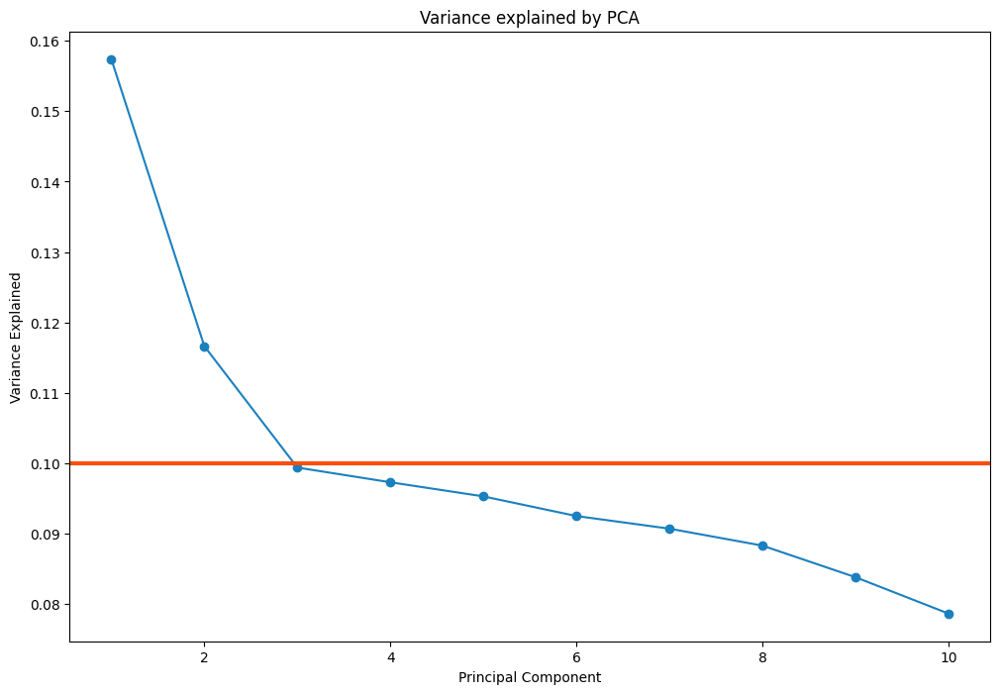

In [12923]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [12924]:
pca = PCA(n_components=N_COMPONENTS)

In [12925]:
X_pca = pca.fit_transform(X_values)

In [12926]:
pd.DataFrame(X_pca).head(8)

,0,1
0,-0.734968,0.878029
1,-1.421502,0.134277
2,-0.185147,0.401322
3,1.639320,-1.105151
4,1.583344,-1.576805
5,-1.484046,0.932966
6,-0.212267,0.888704
7,-0.540848,-0.814278


In [12927]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [12928]:
pca_data = pd.DataFrame(X_pca, columns=pca_columns)

In [12929]:
pca_data = pd.concat([pca_data, corr_dataset[['target']]], axis=1)

In [12930]:
pca_data

,dim_1,dim_2,target
0,-0.734968,0.878029,1
1,-1.421502,0.134277,2
2,-0.185147,0.401322,0
3,1.639320,-1.105151,1
4,1.583344,-1.576805,1
...,...,...,...
4995,1.957296,-1.067440,0
4996,1.692019,0.935322,0
4997,0.565952,-1.567396,1
4998,2.039243,-1.205241,0


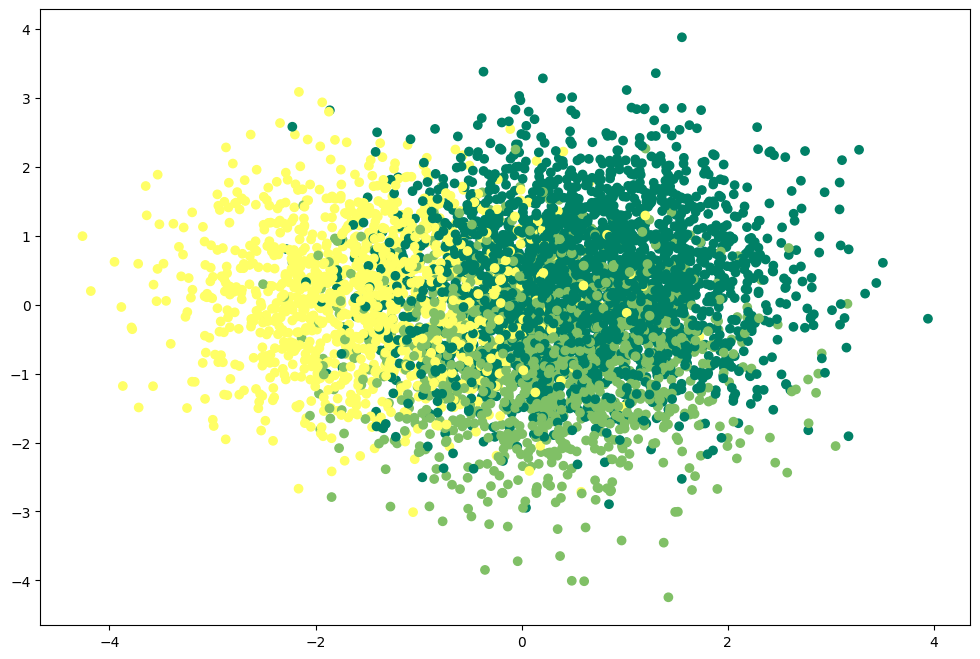

In [12931]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=pca_data['dim_1'],y=pca_data['dim_2'],c=pca_data['target'],cmap='summer')
plt.show()

## t-SNE

In [12932]:
tsne = TSNE(n_components=3,random_state=42)

In [12933]:
X_tsne = tsne.fit_transform(X_values)

In [12934]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [12935]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-21.224058,-20.639149,14.840125,1
1,-26.081778,-8.626050,-3.557741,2
2,-4.091385,-1.652493,24.924829,0
3,9.449872,2.064173,-30.592520,1
4,23.723206,27.423222,0.559779,1
...,...,...,...,...
4995,15.330385,5.485884,-39.771503,0
4996,30.774689,-34.987804,-8.021955,0
4997,-0.014960,22.669317,-17.871101,1
4998,36.017509,2.472015,-22.628633,0


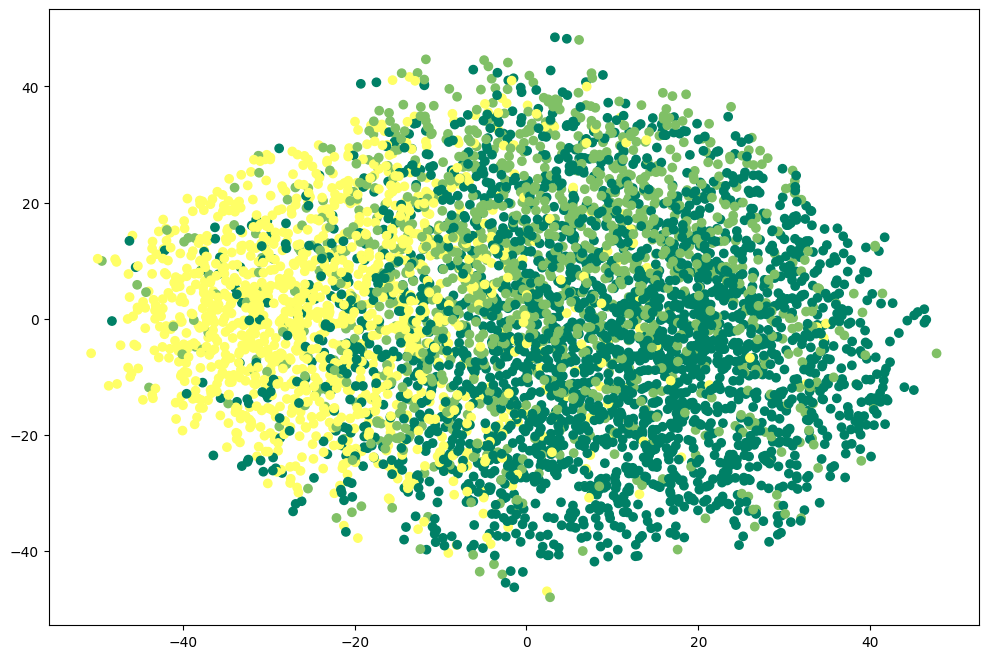

In [12936]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'],cmap='summer')
plt.show()

In [12937]:
tsne.kl_divergence_

2.6697781085968018

## umap

In [12938]:
umap = umap.UMAP(n_components=3,random_state=42)

In [12939]:
X_umap = umap.fit_transform(X_values)

In [12940]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [12941]:
umap_data

,dim_1,dim_2,dim_3,target
0,6.659750,4.096547,5.783712,1
1,6.194016,4.965216,6.973164,2
2,7.413808,4.875452,5.736710,0
3,9.848495,5.801052,6.329156,1
4,9.323628,6.019153,4.698060,1
...,...,...,...,...
4995,10.216153,5.623569,5.905757,0
4996,9.577994,3.826962,5.589040,0
4997,8.343683,6.563516,4.909894,1
4998,10.428288,4.926825,5.364737,0


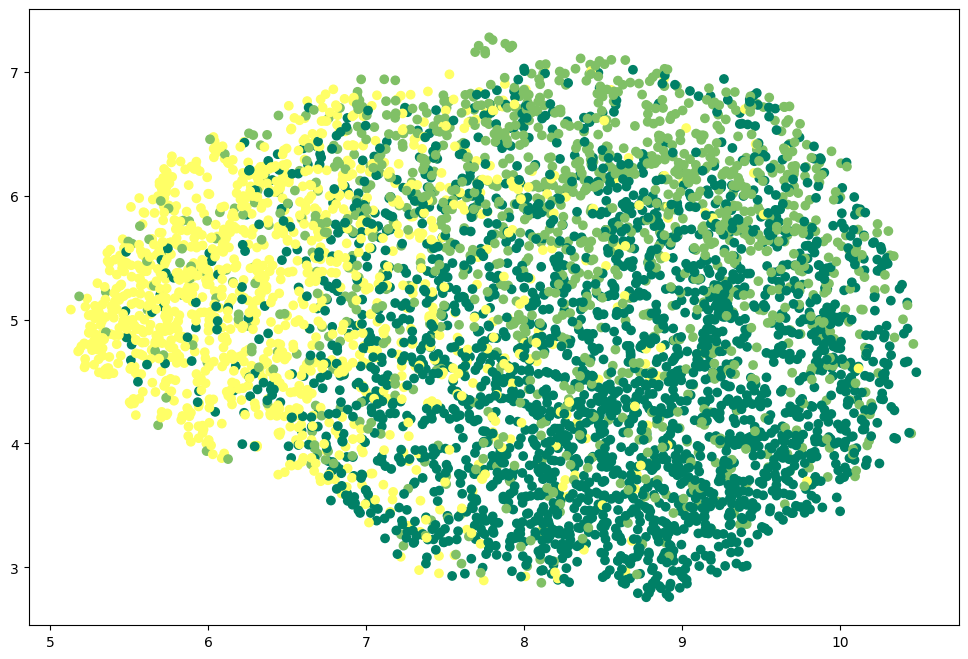

In [12942]:
fig = plt.figure(figsize=(12,8))
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'],cmap='summer')
plt.show()

# clustering algorithms

## k-means 

In [12943]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [12944]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [12945]:
df_kmeans = corr_dataset.copy()

In [12946]:
df_kmeans['k_means'] = kmeans.labels_

In [12947]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,k_means
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,1
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,2
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,2
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,2
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,2


In [12948]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.361
accuracy after: 0.6758


In [12949]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,k_means
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


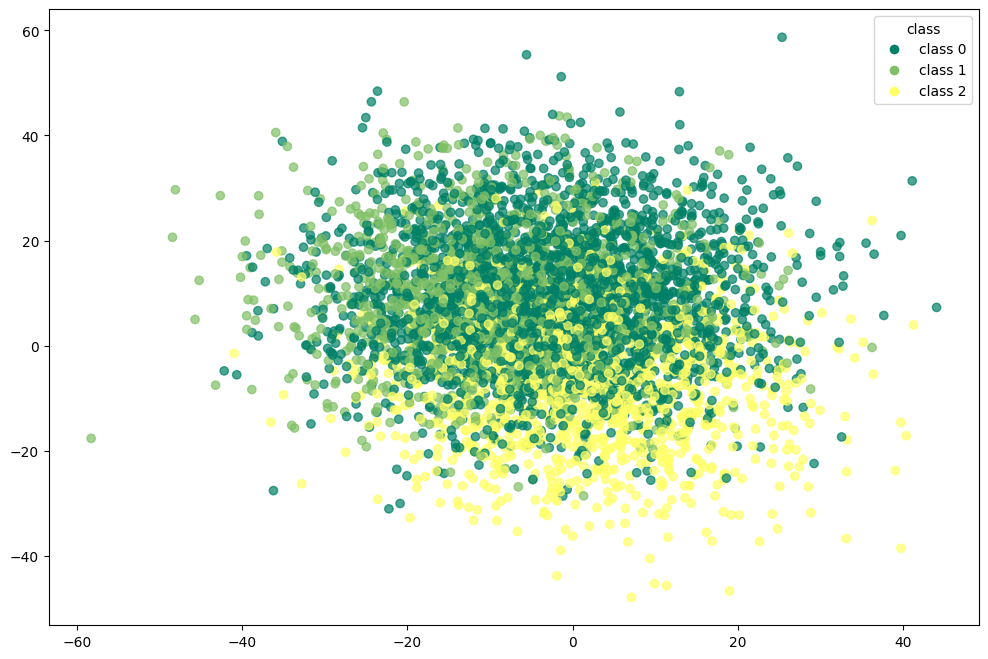

In [12950]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

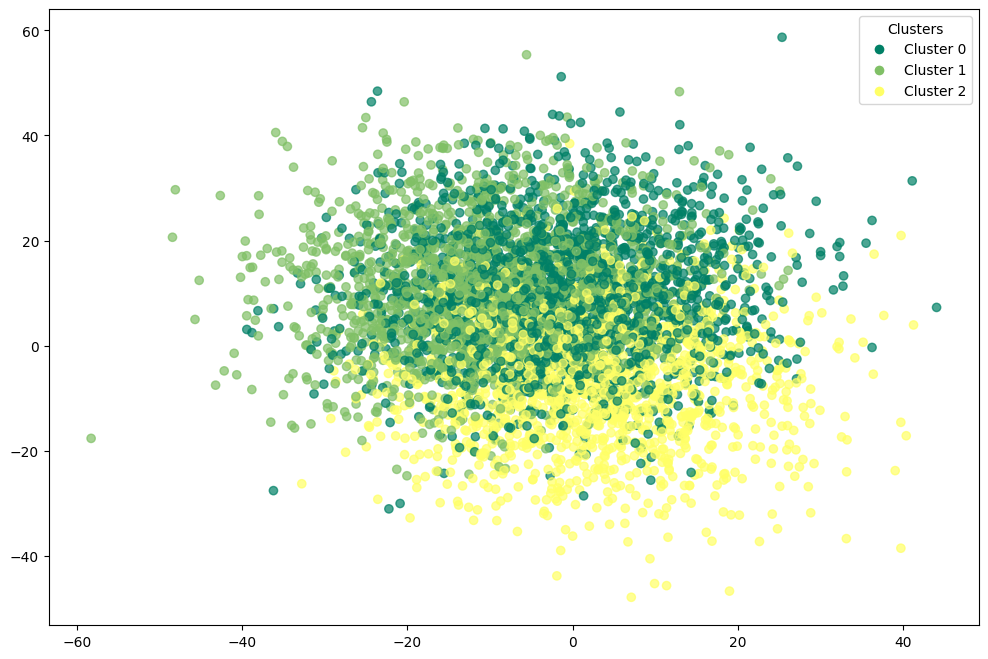

In [12951]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [12952]:
kmeans.cluster_centers_

array([[ 0.14005095,  0.32109052,  0.06177661,  0.5534242 , -0.21295303,
        -0.34066464, -0.44808602,  0.51514046,  0.12839378,  0.55464208],
       [ 0.43885333, -0.81279918, -0.57825326, -0.11880634,  0.34277208,
         0.71315754,  0.04458695, -0.25437365,  0.05168192, -0.57582586],
       [-0.53532976,  0.38238927,  0.44691862, -0.47556485, -0.07989453,
        -0.27366971,  0.43071636, -0.31542   , -0.18046034, -0.07239122]])

In [12953]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1491  728  281]
 [ 221  845  184]
 [  77  130 1043]]


In [12954]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.83      0.60      0.70      2500
           1       0.50      0.68      0.57      1250
           2       0.69      0.83      0.76      1250

    accuracy                           0.68      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.68      0.68      5000



In [12955]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.2785632032560456

In [12956]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.26847022102254353

In [12957]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.08627608168260269

### k-means with pca

In [12958]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [12959]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [12960]:
df_pca_kmeans = corr_dataset.copy()

In [12961]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [12962]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,kmeans_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


In [12963]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.6768
accuracy after: 0.6768


In [12964]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,kmeans_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


In [12965]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1520  703  277]
 [ 230  833  187]
 [  89  130 1031]]


In [12966]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.83      0.61      0.70      2500
           1       0.50      0.67      0.57      1250
           2       0.69      0.82      0.75      1250

    accuracy                           0.68      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.68      0.68      5000



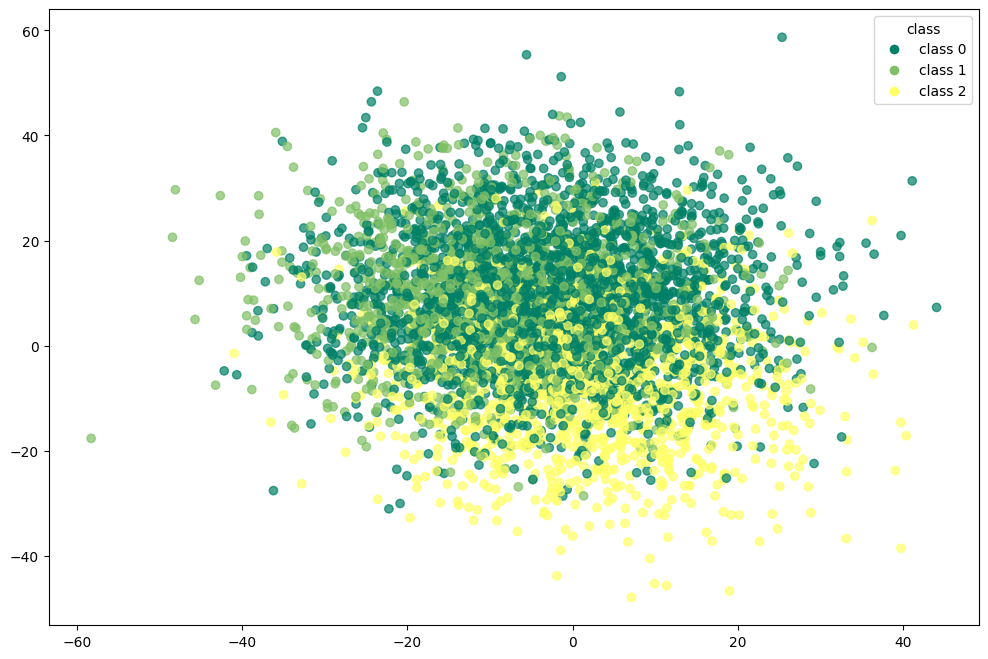

In [12967]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

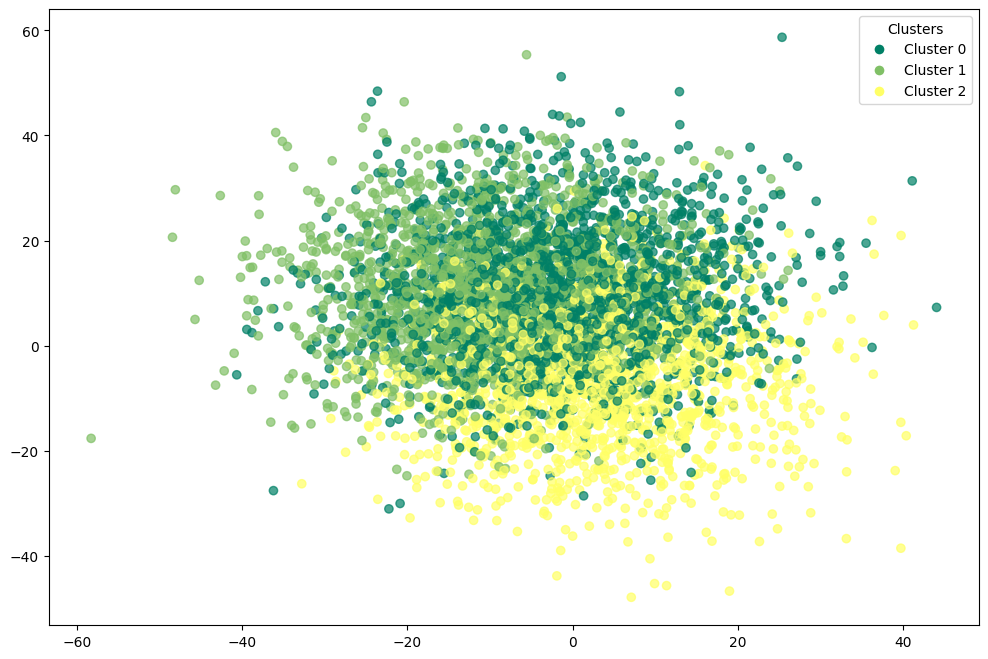

In [12968]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [12969]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.2792950033299338

In [12970]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.26363126906839546

In [12971]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.08538914443950354

### k-means with t-SNE

In [12972]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [12973]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [12974]:
df_tsne_kmeans = corr_dataset.copy()

In [12975]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [12976]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,kmeans_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [12977]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.5638
accuracy after: 0.5638


In [12978]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,kmeans_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


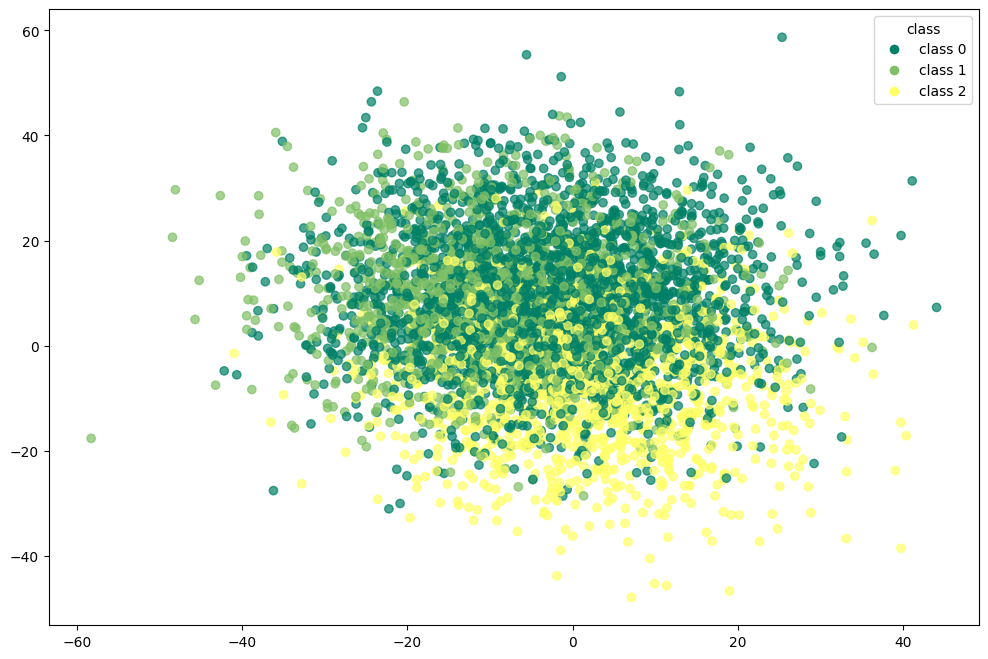

In [12979]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

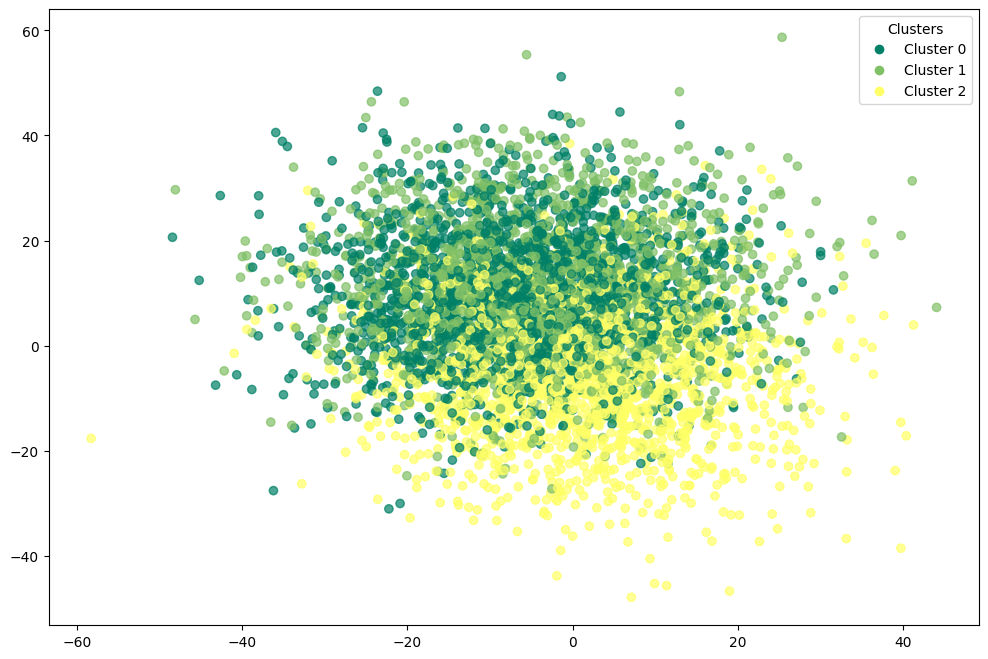

In [12980]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [12981]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1297  800  403]
 [ 429  526  295]
 [  80  174  996]]


In [12982]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.72      0.52      0.60      2500
           1       0.35      0.42      0.38      1250
           2       0.59      0.80      0.68      1250

    accuracy                           0.56      5000
   macro avg       0.55      0.58      0.55      5000
weighted avg       0.59      0.56      0.57      5000



In [12983]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.15977398619554165

In [12984]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.1594119992529749

In [12985]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.06101367622925404

### k-means with umap

In [12986]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [12987]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [12988]:
df_umap_kmeans = corr_dataset.copy()

In [12989]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [12990]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,kmeans_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [12991]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.6522
accuracy after: 0.6522


In [12992]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,kmeans_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


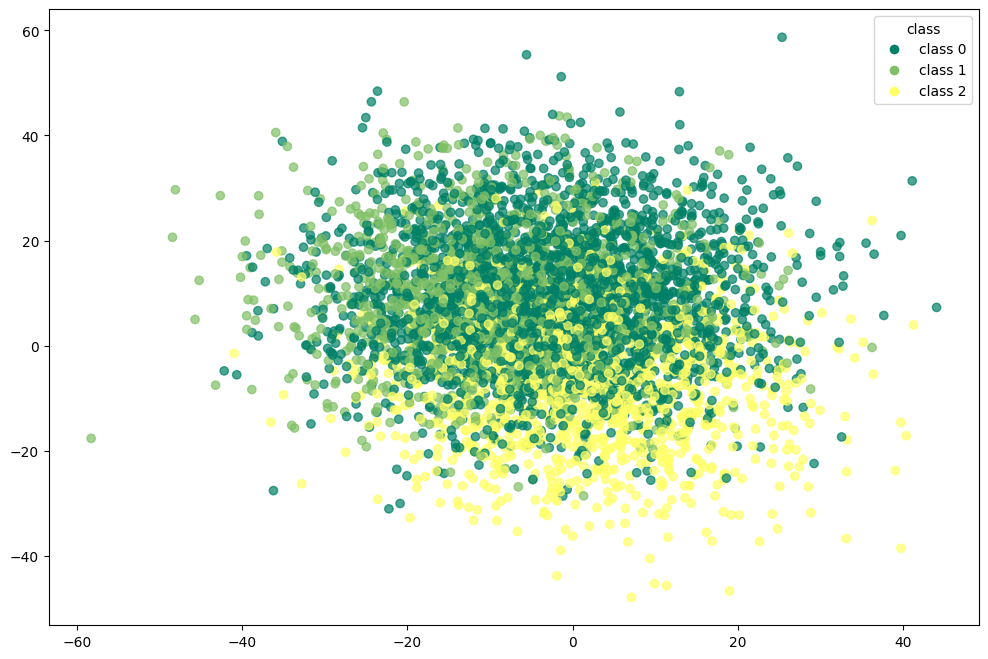

In [12993]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

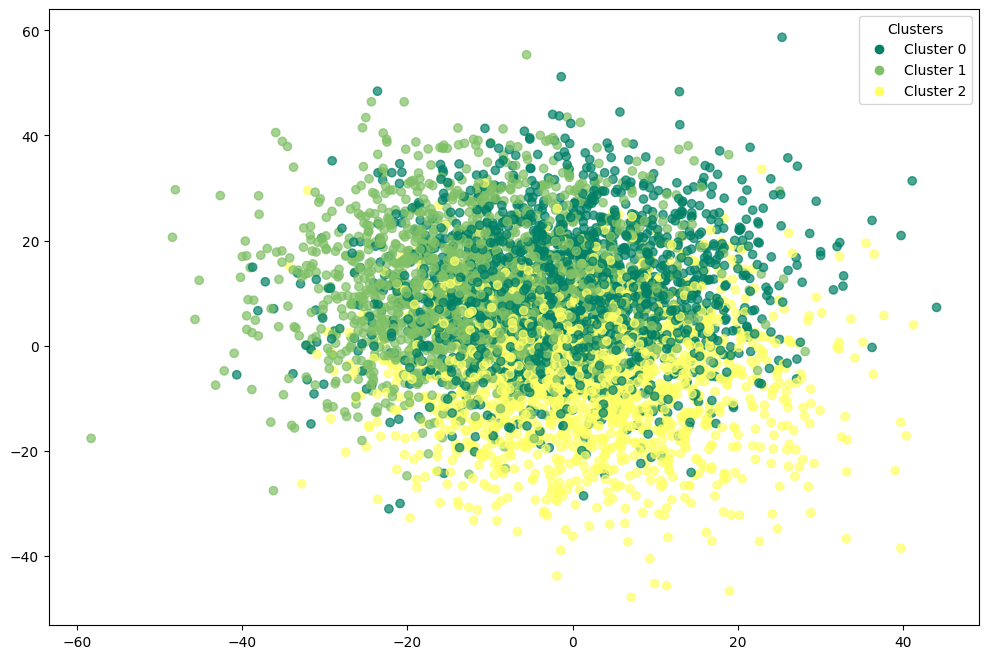

In [12994]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [12995]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1422  729  349]
 [ 241  780  229]
 [  93   98 1059]]


In [12996]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.81      0.57      0.67      2500
           1       0.49      0.62      0.55      1250
           2       0.65      0.85      0.73      1250

    accuracy                           0.65      5000
   macro avg       0.65      0.68      0.65      5000
weighted avg       0.69      0.65      0.65      5000



In [12997]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.24477760414627758

In [12998]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.23980245966563637

In [12999]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.07588989058497843

## Birch

In [13000]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13001]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [13002]:
df_birch = corr_dataset.copy()

In [13003]:
df_birch['birch'] = birch.labels_

In [13004]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13005]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.577
accuracy after: 0.577


In [13006]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


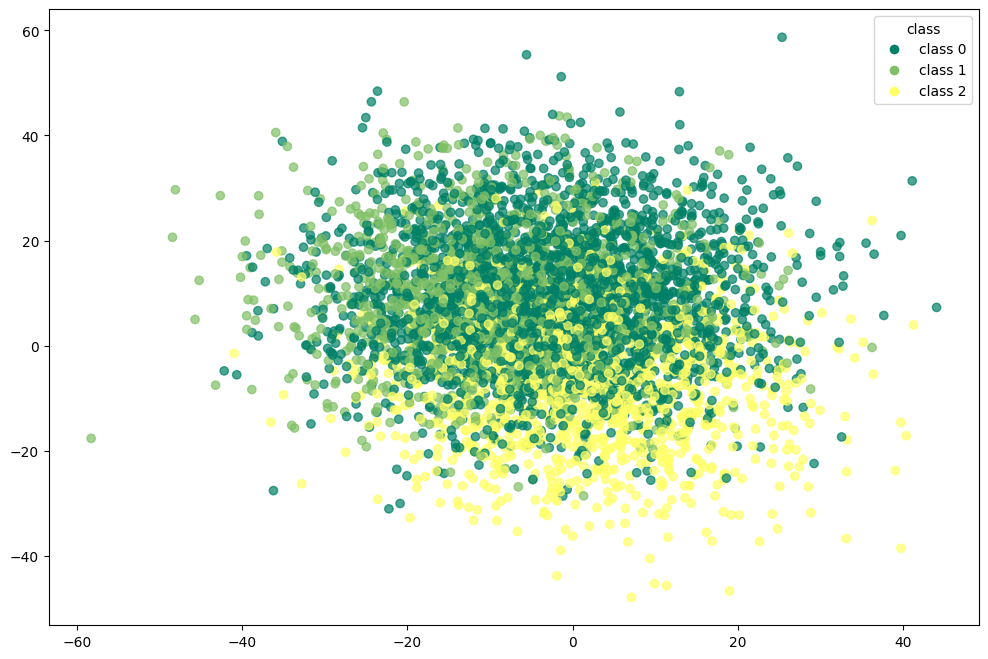

In [13007]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

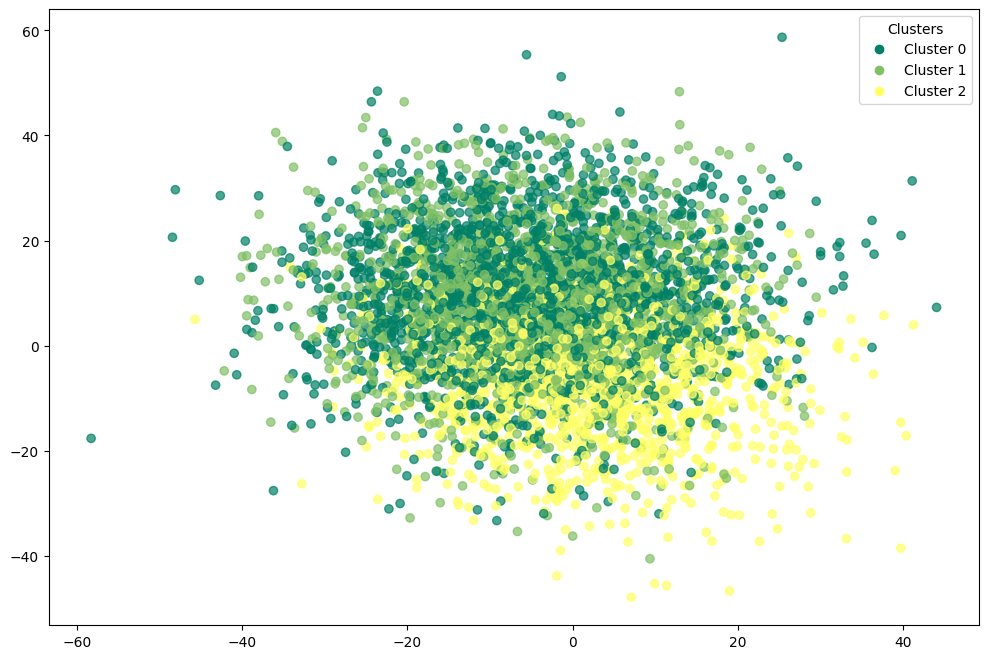

In [13008]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13009]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[1482  677  341]
 [ 434  626  190]
 [ 166  307  777]]


In [13010]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.71      0.59      0.65      2500
           1       0.39      0.50      0.44      1250
           2       0.59      0.62      0.61      1250

    accuracy                           0.58      5000
   macro avg       0.56      0.57      0.56      5000
weighted avg       0.60      0.58      0.58      5000



In [13011]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.15118756466169442

In [13012]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.12795267527298582

In [13013]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.04202787482671456

### Birch with pca

In [13014]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13015]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [13016]:
df_pca_birch = corr_dataset.copy()

In [13017]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [13018]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


In [13019]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.267
accuracy after: 0.5238


In [13020]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


In [13021]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[1066 1201  233]
 [ 177  723  350]
 [ 379   41  830]]


In [13022]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.66      0.43      0.52      2500
           1       0.37      0.58      0.45      1250
           2       0.59      0.66      0.62      1250

    accuracy                           0.52      5000
   macro avg       0.54      0.56      0.53      5000
weighted avg       0.57      0.52      0.53      5000



In [13023]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.16679787967586598

In [13024]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.1850916252994313

In [13025]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.07472996673005998

### Birch with t-SNE

In [13026]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13027]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [13028]:
df_tsne_birch = corr_dataset.copy()

In [13029]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [13030]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,2
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


In [13031]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.305
accuracy after: 0.5108


In [13032]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


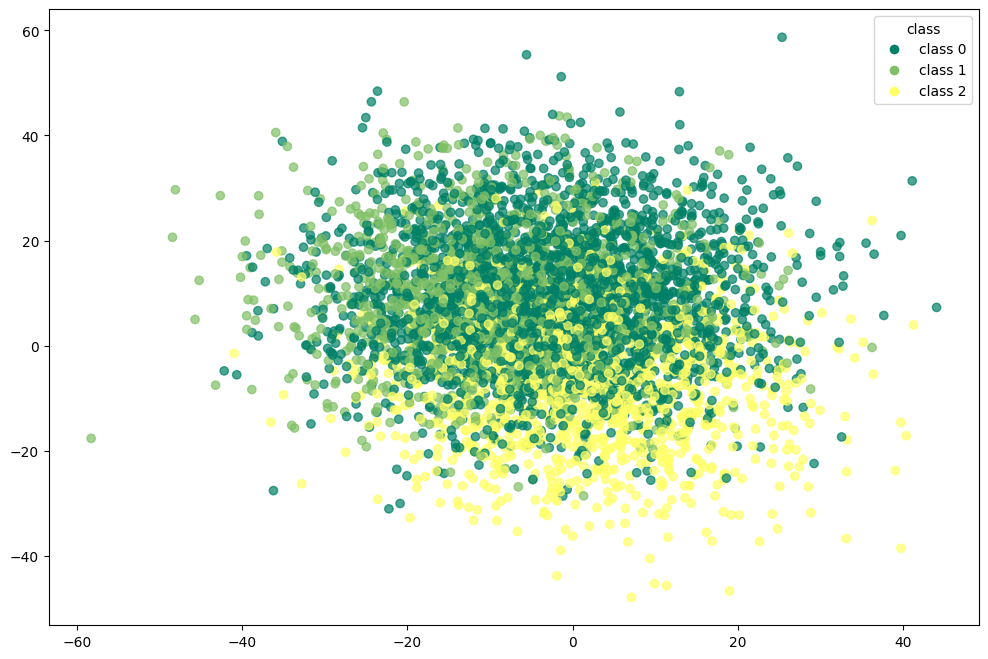

In [13033]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

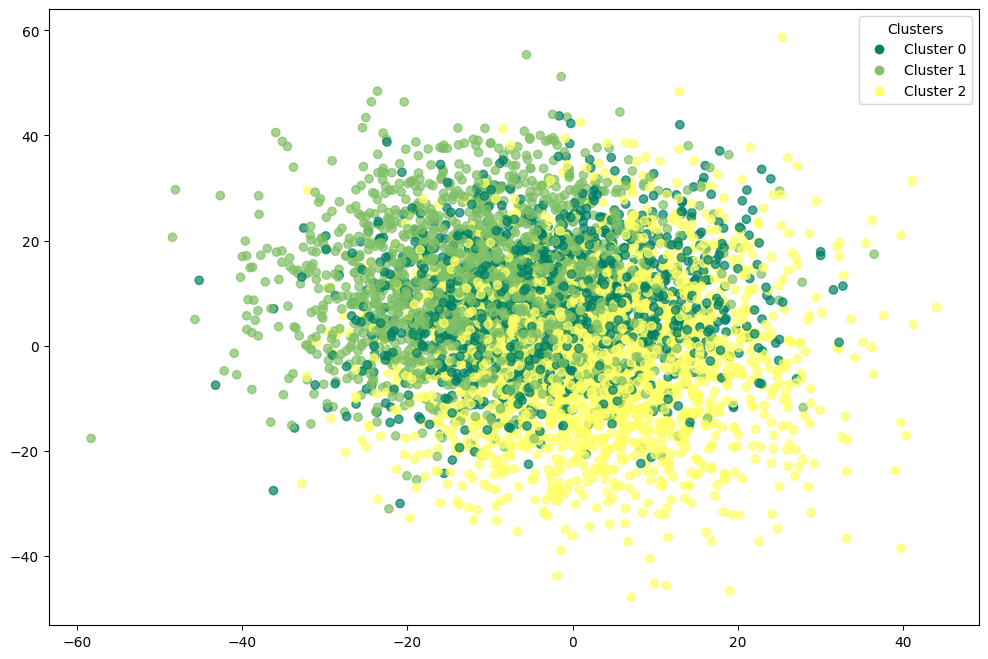

In [13034]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13035]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[ 852  933  715]
 [ 226  696  328]
 [ 114  130 1006]]


In [13036]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.71      0.34      0.46      2500
           1       0.40      0.56      0.46      1250
           2       0.49      0.80      0.61      1250

    accuracy                           0.51      5000
   macro avg       0.53      0.57      0.51      5000
weighted avg       0.58      0.51      0.50      5000



In [13037]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.0905832631422375

In [13038]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.11807753520042259

In [13039]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.03948312121269216

### Birch with umap

In [13040]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13041]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [13042]:
df_umap_birch = corr_dataset.copy()

In [13043]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [13044]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,1
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,2
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13045]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.2394
accuracy after: 0.6274


In [13046]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,birch_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


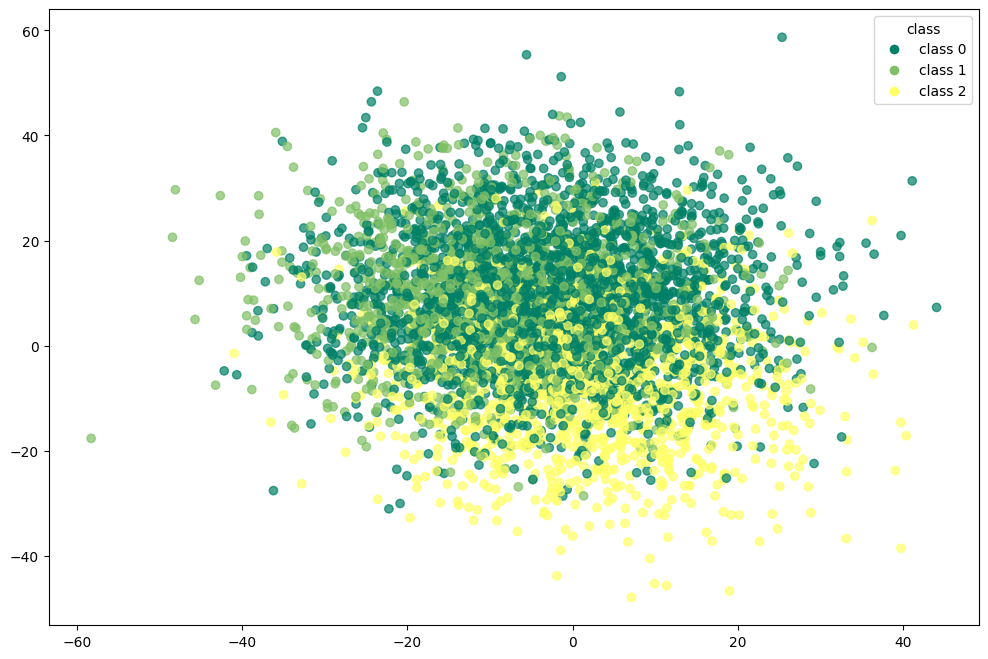

In [13047]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

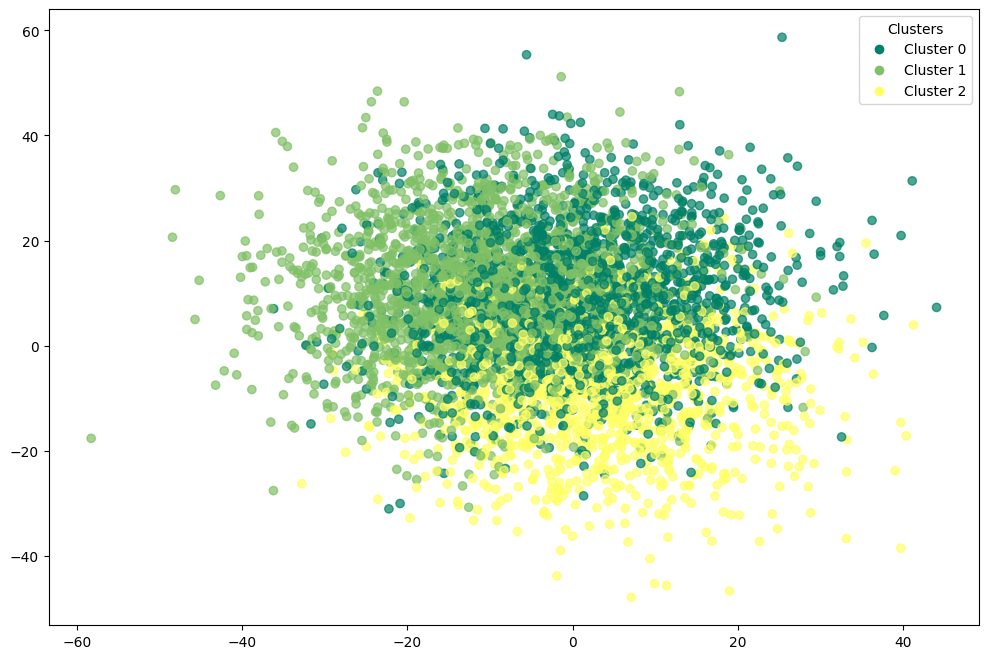

In [13048]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13049]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[1357  938  205]
 [ 256  868  126]
 [ 133  205  912]]


In [13050]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       0.78      0.54      0.64      2500
           1       0.43      0.69      0.53      1250
           2       0.73      0.73      0.73      1250

    accuracy                           0.63      5000
   macro avg       0.65      0.66      0.63      5000
weighted avg       0.68      0.63      0.64      5000



In [13051]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.21654784215789455

In [13052]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.2207387612960051

In [13053]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.06908414547185666

## GMM - Gaussian Mixture Models

In [13054]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13055]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13056]:
df_gmm = corr_dataset.copy()

In [13057]:
df_gmm['gmm'] = gmm.predict(X_values)

In [13058]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,gmm
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,1
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13059]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.3906
accuracy after: 0.5246


In [13060]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,gmm
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,2
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


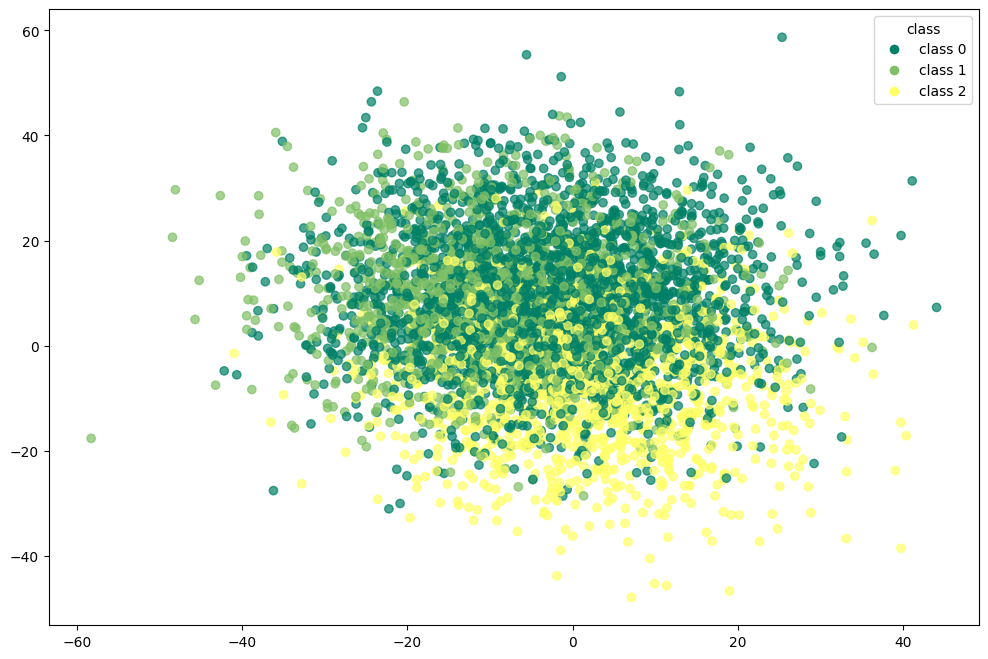

In [13061]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

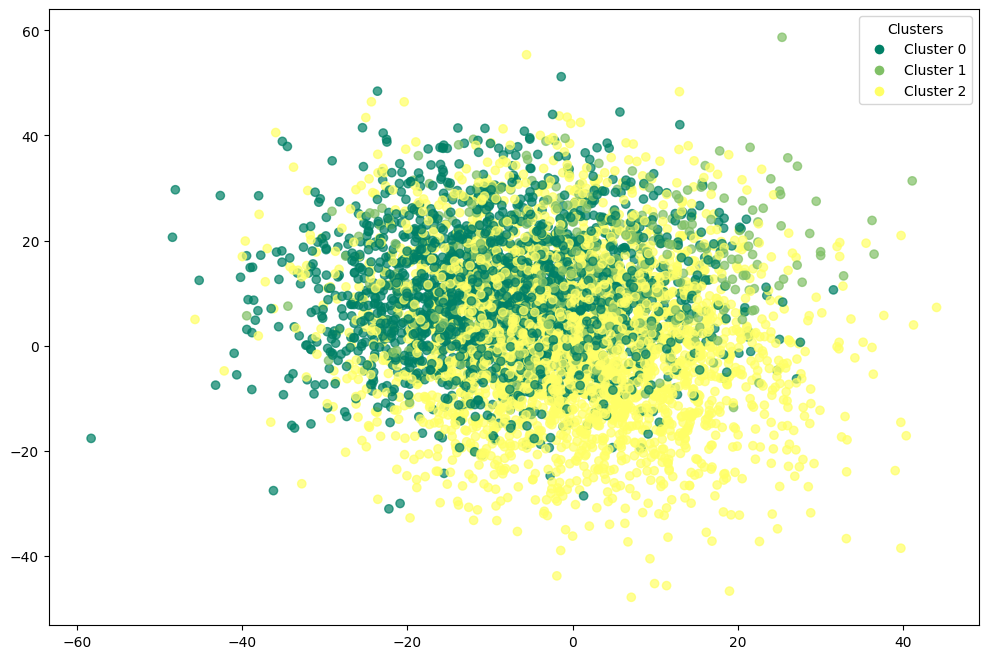

In [13062]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13063]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1310  213  977]
 [ 471  182  597]
 [  73   46 1131]]


In [13064]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.71      0.52      0.60      2500
           1       0.41      0.15      0.22      1250
           2       0.42      0.90      0.57      1250

    accuracy                           0.52      5000
   macro avg       0.51      0.52      0.46      5000
weighted avg       0.56      0.52      0.50      5000



In [13065]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.08364454249611011

In [13066]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.11439004072592733

In [13067]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.06069151417306921

### GMM with pca

In [13068]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13069]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13070]:
df_pca_gmm = corr_dataset.copy()

In [13071]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [13072]:
df_pca_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,gmm_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13073]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.566
accuracy after: 0.566


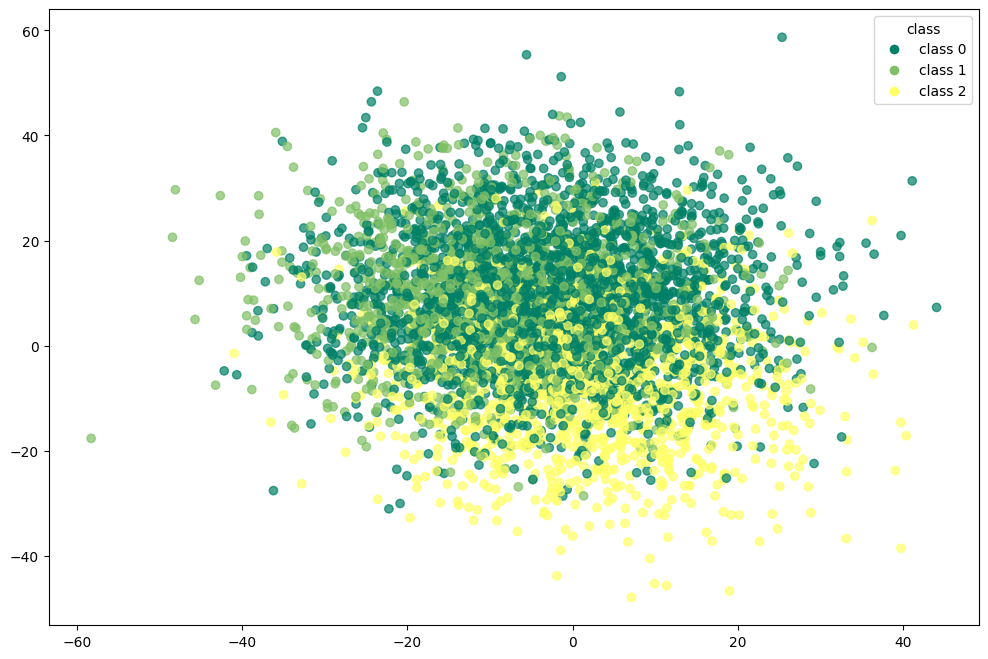

In [13074]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

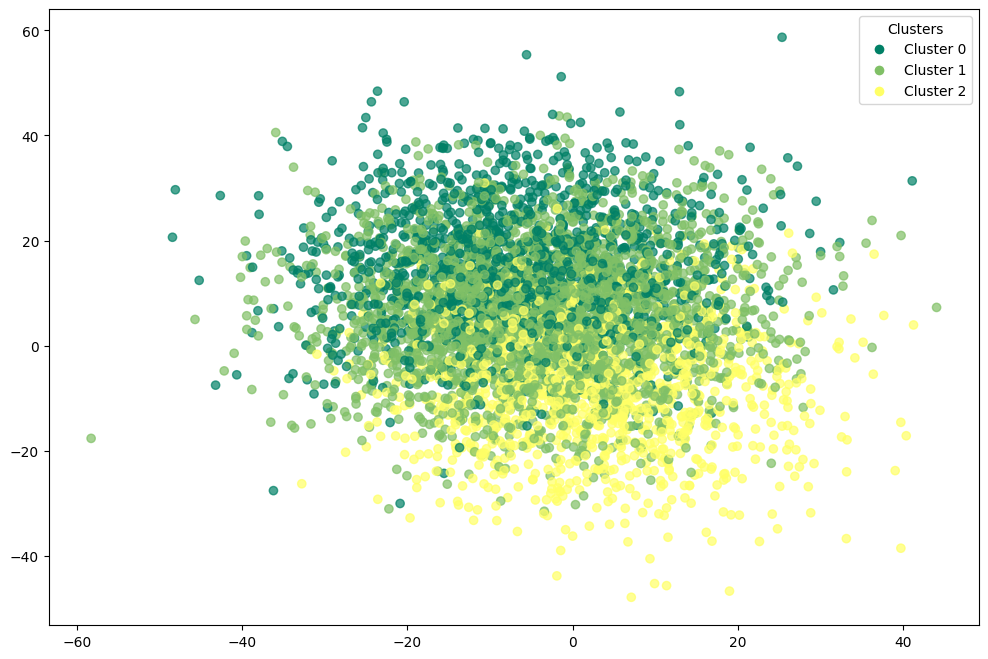

In [13075]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13076]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1101 1265  134]
 [ 281  820  149]
 [  11  330  909]]


In [13077]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.79      0.44      0.57      2500
           1       0.34      0.66      0.45      1250
           2       0.76      0.73      0.74      1250

    accuracy                           0.57      5000
   macro avg       0.63      0.61      0.59      5000
weighted avg       0.67      0.57      0.58      5000



In [13078]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.18676025332336896

In [13079]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.23491717301615053

In [13080]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.05684331411845317

### GMM with t-SNE

In [13081]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13082]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13083]:
df_tsne_gmm = corr_dataset.copy()

In [13084]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [13085]:
df_tsne_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,gmm_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13086]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.5032
accuracy after: 0.5032


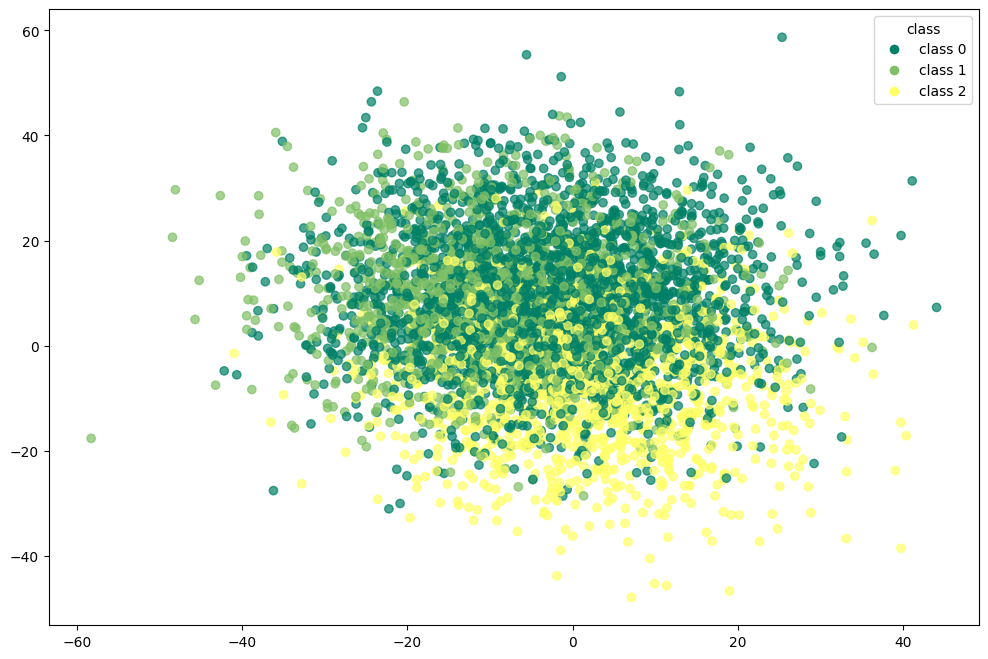

In [13087]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

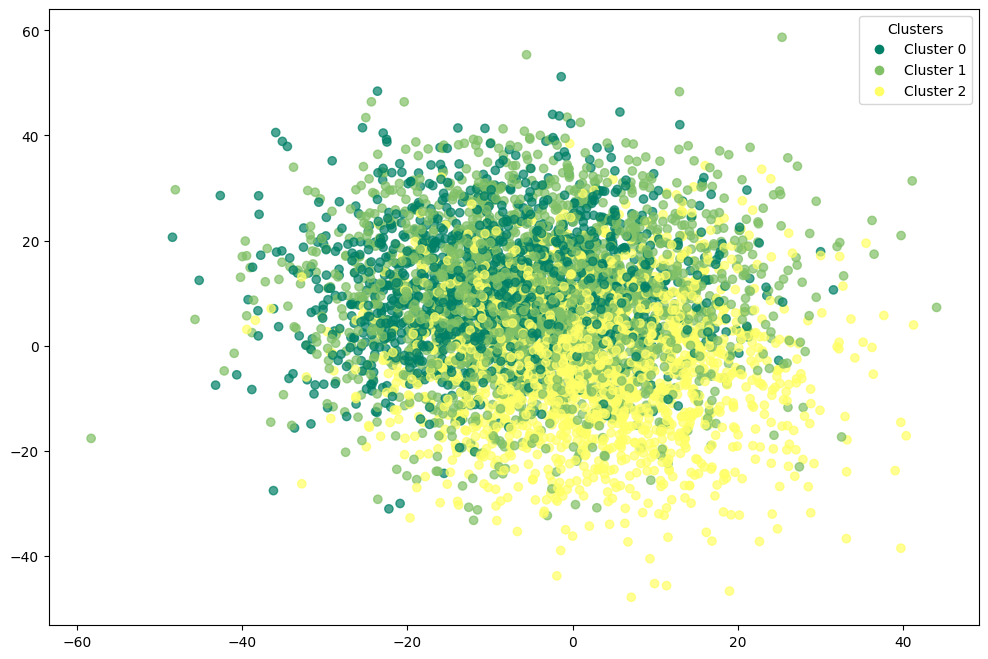

In [13088]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13089]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[966 921 613]
 [329 659 262]
 [ 24 335 891]]


In [13090]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.73      0.39      0.51      2500
           1       0.34      0.53      0.42      1250
           2       0.50      0.71      0.59      1250

    accuracy                           0.50      5000
   macro avg       0.53      0.54      0.50      5000
weighted avg       0.58      0.50      0.50      5000



In [13091]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.08273134752928533

In [13092]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.11765046246938655

In [13093]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.05078043747734022

### GMM with umap

In [13094]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13095]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13096]:
df_umap_gmm = corr_dataset.copy()

In [13097]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [13098]:
df_umap_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,gmm_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13099]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.5376
accuracy after: 0.5376


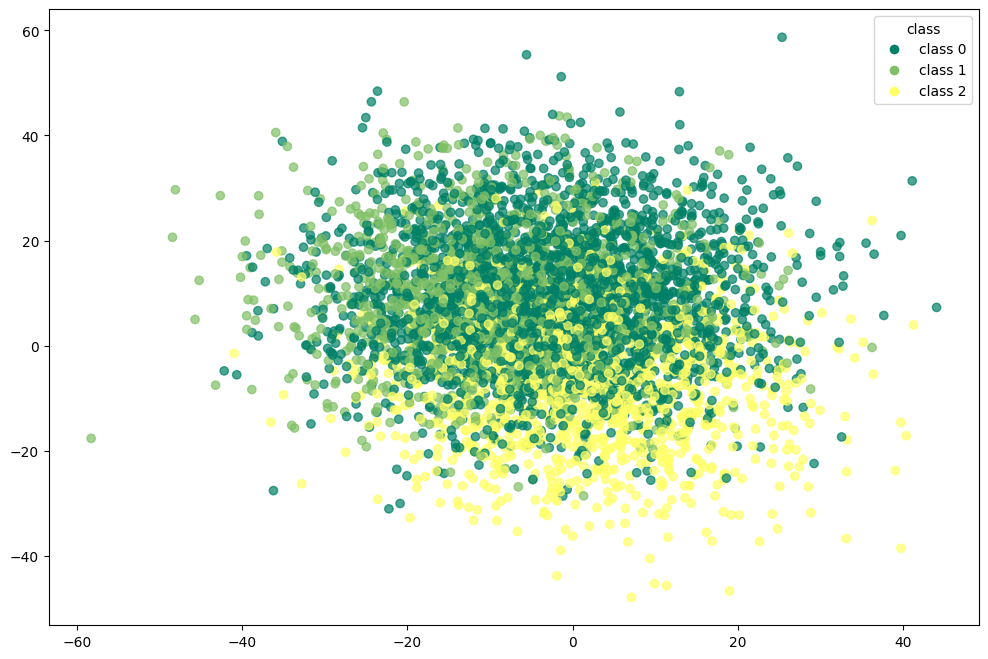

In [13100]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

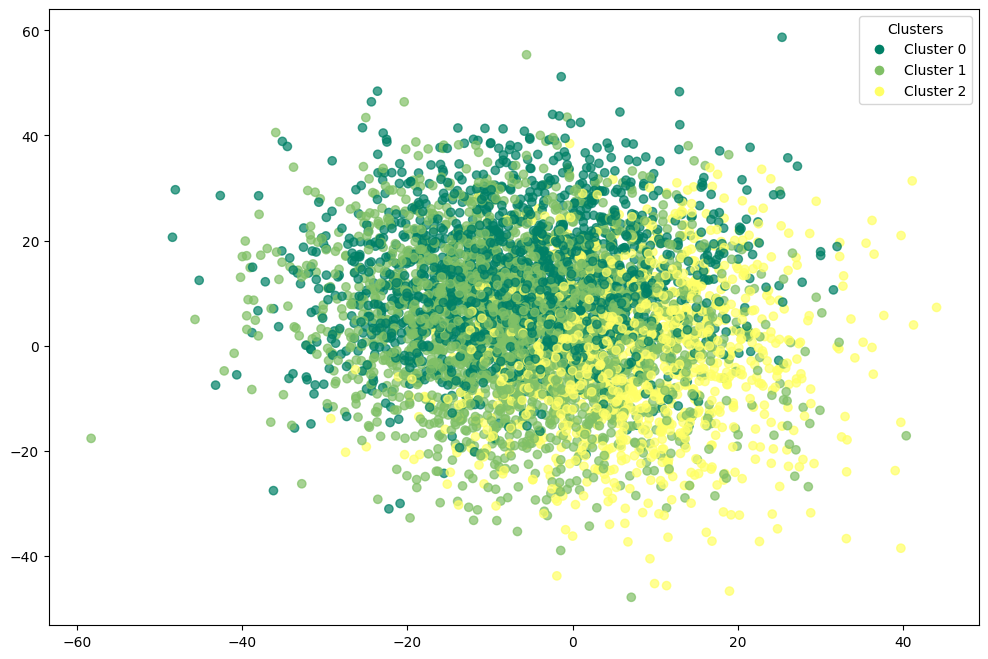

In [13101]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13102]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1329  641  530]
 [ 349  805   96]
 [  38  658  554]]


In [13103]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.77      0.53      0.63      2500
           1       0.38      0.64      0.48      1250
           2       0.47      0.44      0.46      1250

    accuracy                           0.54      5000
   macro avg       0.54      0.54      0.52      5000
weighted avg       0.60      0.54      0.55      5000



In [13104]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.11934121404618102

In [13105]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.14665357778331264

In [13106]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.05831327482311067

## pam

In [13107]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [13108]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13109]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [13110]:
pam.process()

In [13111]:
clusters = pam.get_clusters()

In [13112]:
medoids = pam.get_medoids()

In [13113]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13114]:
df_pam = corr_dataset.copy()

In [13115]:
df_pam['pam'] = labels

In [13116]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,0.0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2.0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2.0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1.0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1.0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1.0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,0.0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0.0


In [13117]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.4188
accuracy after: 0.5818


In [13118]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


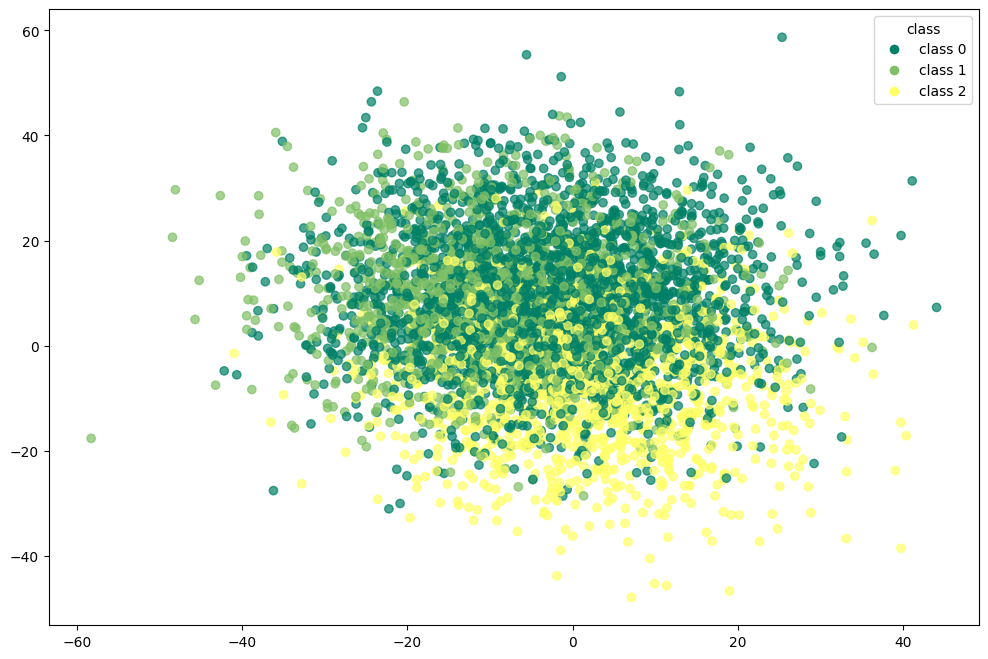

In [13119]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

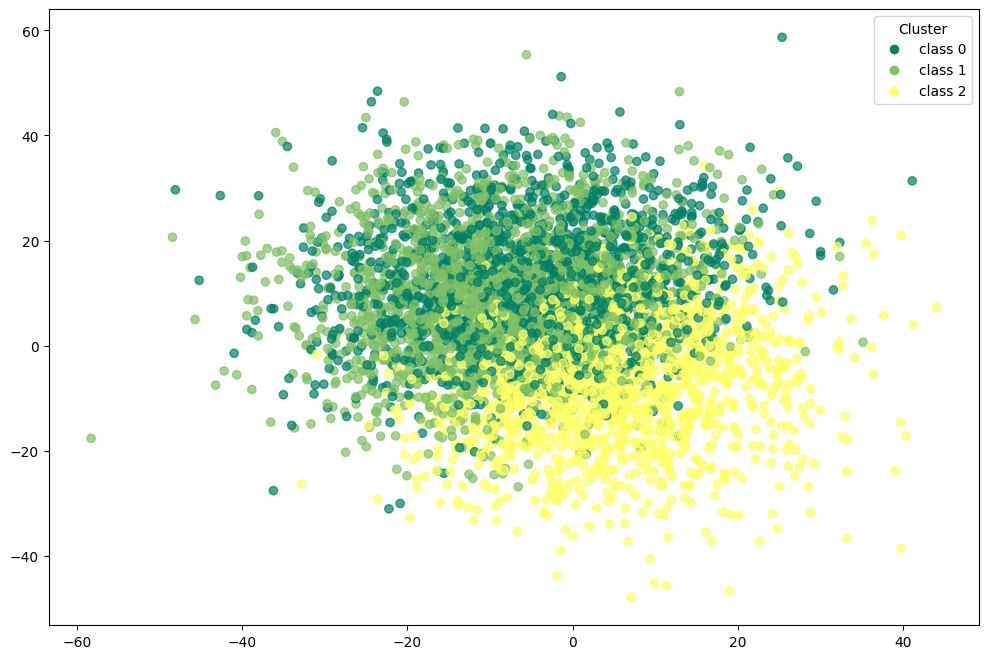

In [13120]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13121]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1235  824  441]
 [ 318  722  210]
 [  39  259  952]]


In [13122]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.78      0.49      0.60      2500
           1       0.40      0.58      0.47      1250
           2       0.59      0.76      0.67      1250

    accuracy                           0.58      5000
   macro avg       0.59      0.61      0.58      5000
weighted avg       0.64      0.58      0.59      5000



In [13123]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.15743834347650865

In [13124]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.1732776349839149

In [13125]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.07419716908461046

### pam with pca

In [13126]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [13127]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13128]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [13129]:
pam_pca.process()

In [13130]:
clusters = pam_pca.get_clusters()

In [13131]:
medoids = pam_pca.get_medoids()

In [13132]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13133]:
df_pam_pca = corr_dataset.copy()

In [13134]:
df_pam_pca['pam_pca'] = labels

In [13135]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1.0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,1.0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2.0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0.0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0.0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,2.0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,0.0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0.0


In [13136]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.1942
accuracy after: 0.6744


In [13137]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


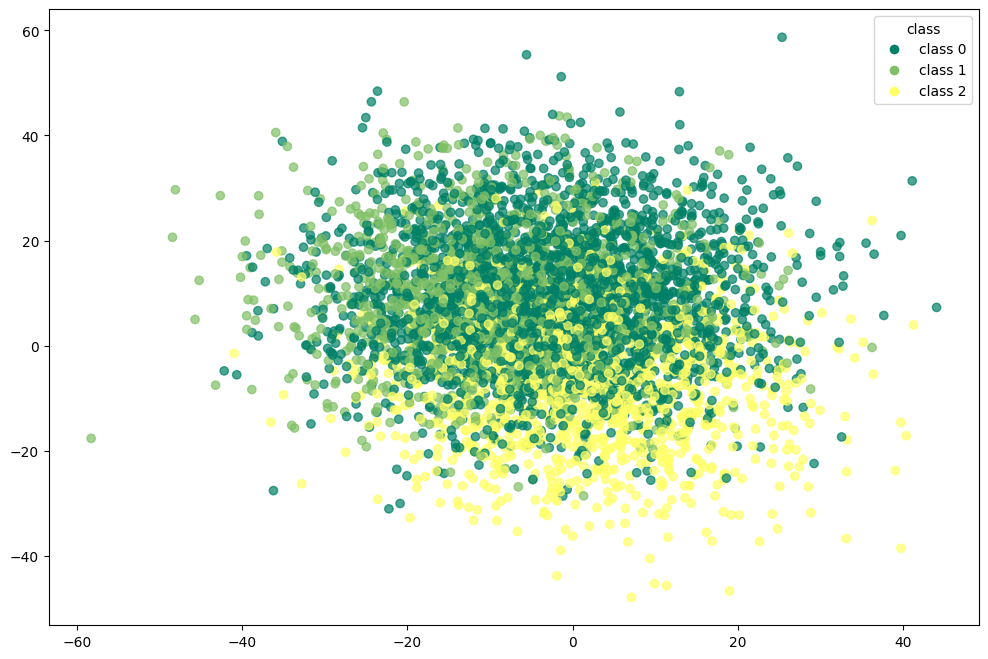

In [13138]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

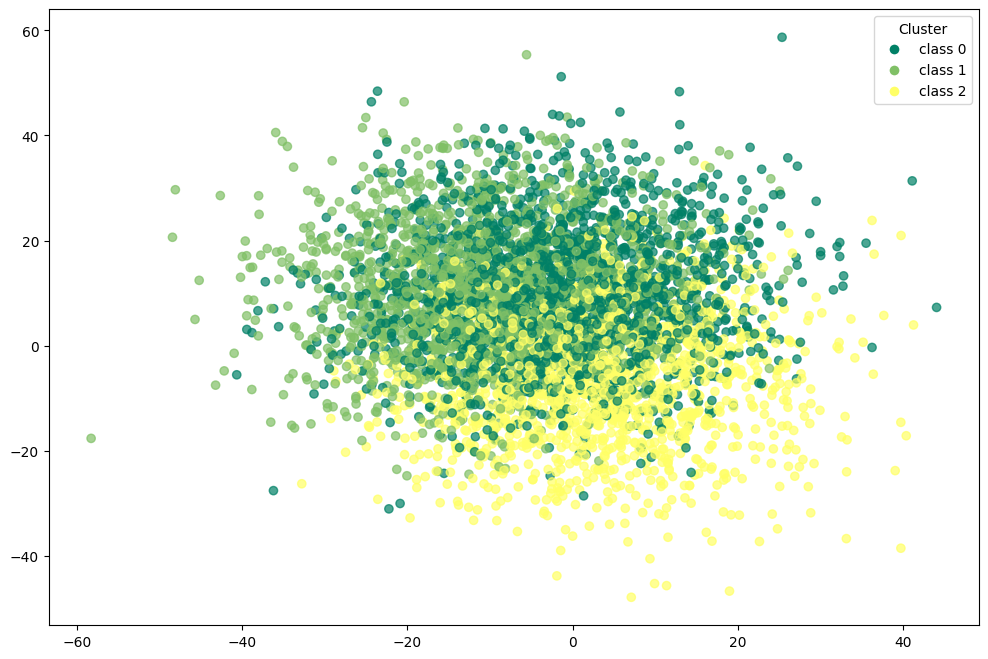

In [13139]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13140]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1505  704  291]
 [ 232  832  186]
 [  81  134 1035]]


In [13141]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.83      0.60      0.70      2500
           1       0.50      0.67      0.57      1250
           2       0.68      0.83      0.75      1250

    accuracy                           0.67      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.67      0.68      5000



In [13142]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.2750885673241386

In [13143]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.2617039792625276

In [13144]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.08518160845057983

### pam with t-SNE

In [13145]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [13146]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13147]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [13148]:
pam_tsne.process()

In [13149]:
clusters = pam_tsne.get_clusters()

In [13150]:
medoids = pam_tsne.get_medoids()

In [13151]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13152]:
df_pam_tsne = corr_dataset.copy()

In [13153]:
df_pam_tsne['pam_tsne'] = labels

In [13154]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,0.0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,0.0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0.0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1.0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1.0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,2.0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1.0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1.0


In [13155]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.249
accuracy after: 0.6212


In [13156]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


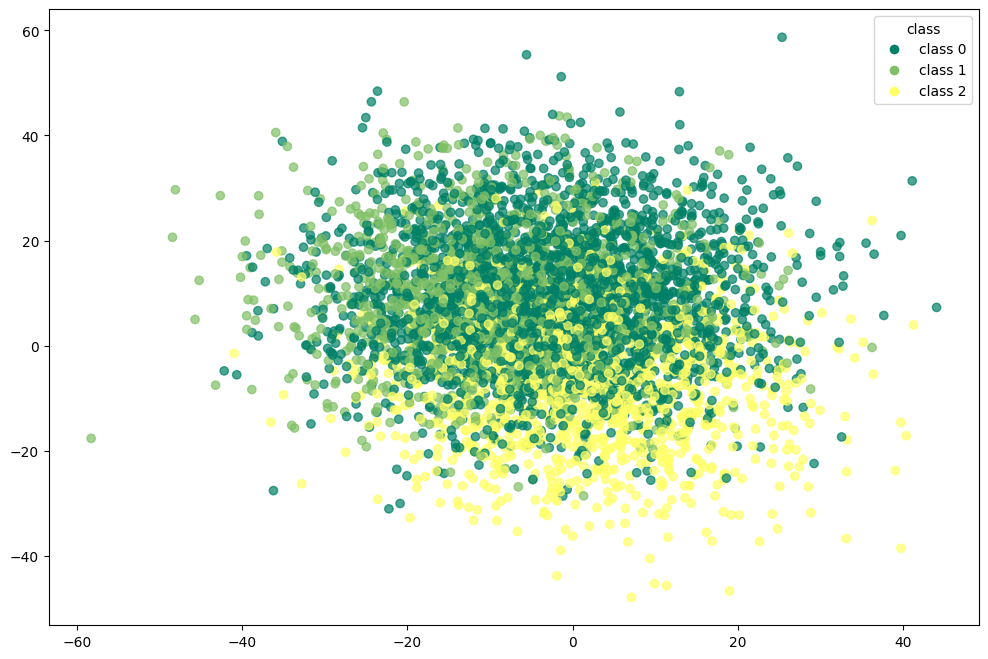

In [13157]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

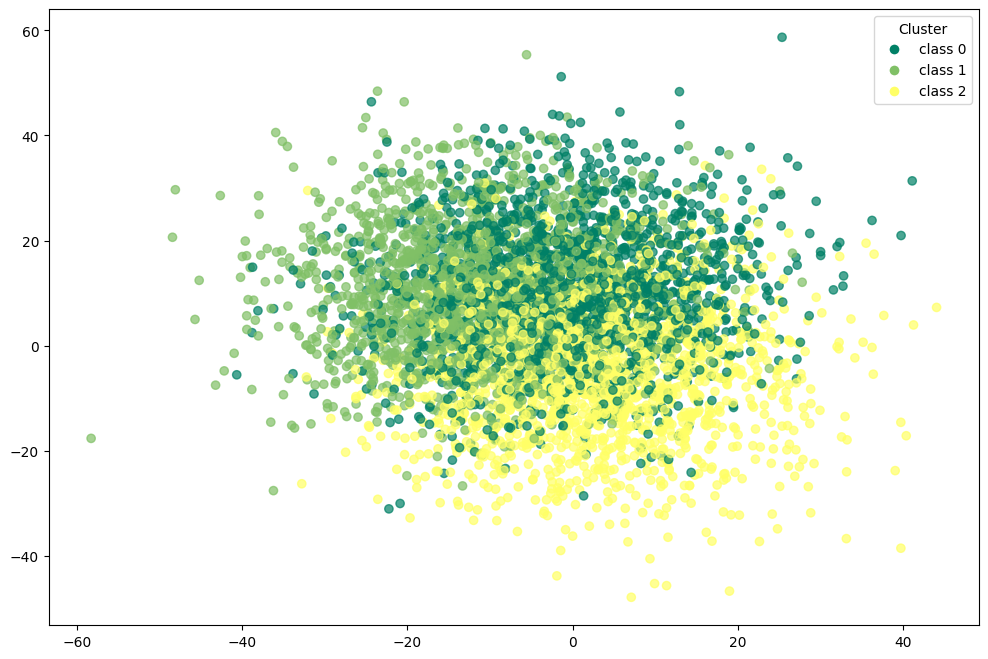

In [13158]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13159]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1347  727  426]
 [ 228  737  285]
 [  82  146 1022]]


In [13160]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.81      0.54      0.65      2500
           1       0.46      0.59      0.52      1250
           2       0.59      0.82      0.69      1250

    accuracy                           0.62      5000
   macro avg       0.62      0.65      0.62      5000
weighted avg       0.67      0.62      0.62      5000



In [13161]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.19960450229189

In [13162]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.19918992988454975

In [13163]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.062447046322537426

### pam with umap

In [13164]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [13165]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13166]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [13167]:
pam_umap.process()

In [13168]:
clusters = pam_umap.get_clusters()

In [13169]:
medoids = pam_umap.get_medoids()

In [13170]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13171]:
df_pam_umap = corr_dataset.copy()

In [13172]:
df_pam_umap['pam_umap'] = labels

In [13173]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,0.0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,0.0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0.0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1.0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1.0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,2.0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1.0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1.0


In [13174]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.2428
accuracy after: 0.6408


In [13175]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,pam_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


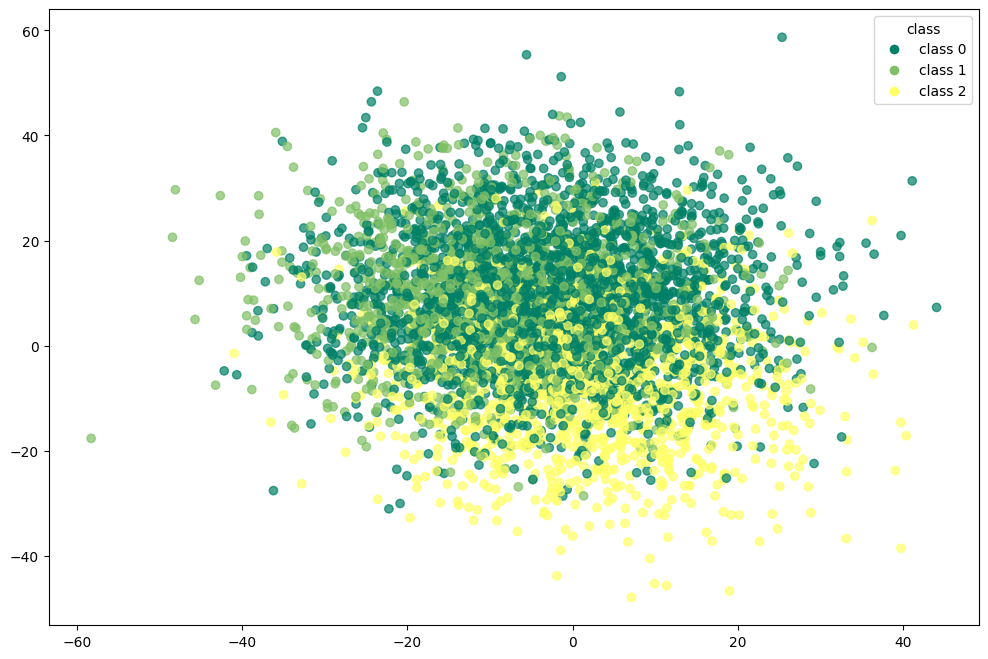

In [13176]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

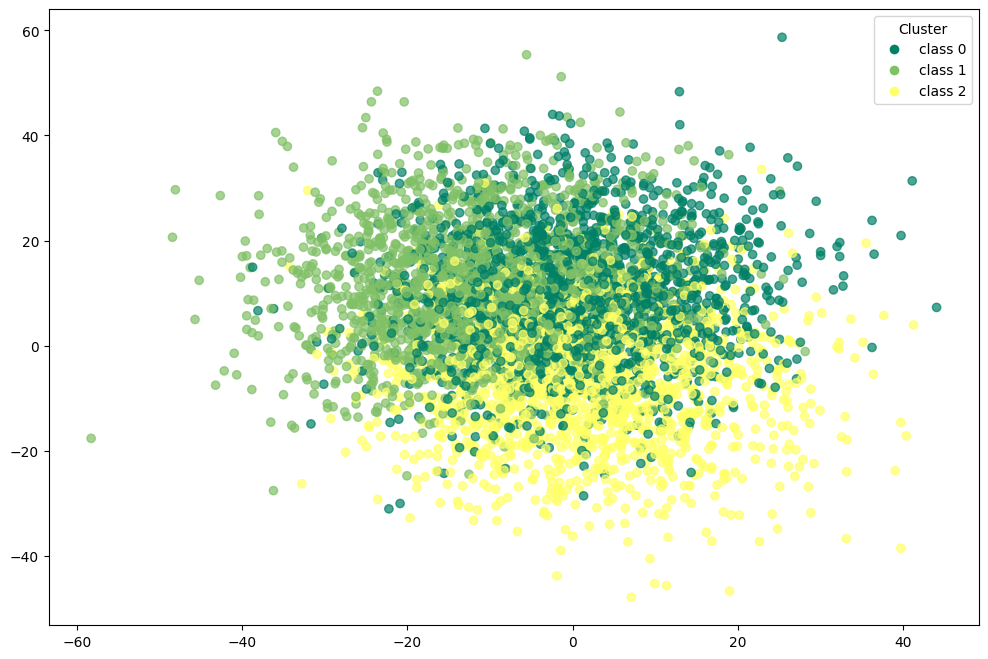

In [13177]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13178]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1367  816  317]
 [ 222  784  244]
 [ 113   84 1053]]


In [13179]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.80      0.55      0.65      2500
           1       0.47      0.63      0.53      1250
           2       0.65      0.84      0.74      1250

    accuracy                           0.64      5000
   macro avg       0.64      0.67      0.64      5000
weighted avg       0.68      0.64      0.64      5000



In [13180]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.23717336195245228

In [13181]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.23783136219329126

In [13182]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.07450066179097668

## spectral clustering

In [13183]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13184]:
spectral_clustering.fit(X_values)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13185]:
df_spectral = corr_dataset.copy()

In [13186]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [13187]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_clustering
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,1
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,2
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,2
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,2
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,2


In [13188]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.3768
accuracy after: 0.6766


In [13189]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_clustering
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


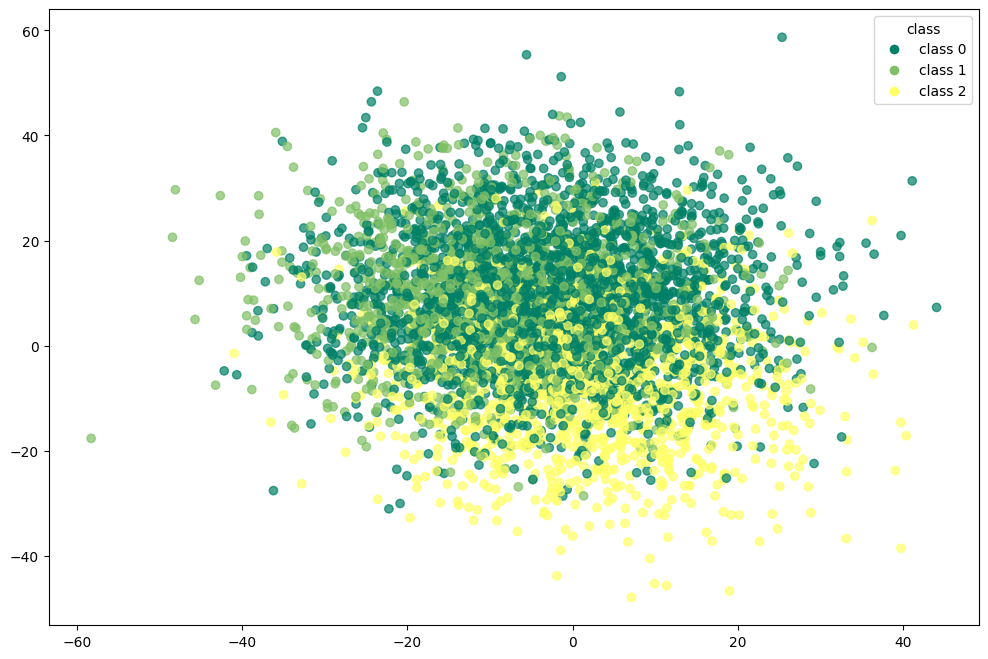

In [13190]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

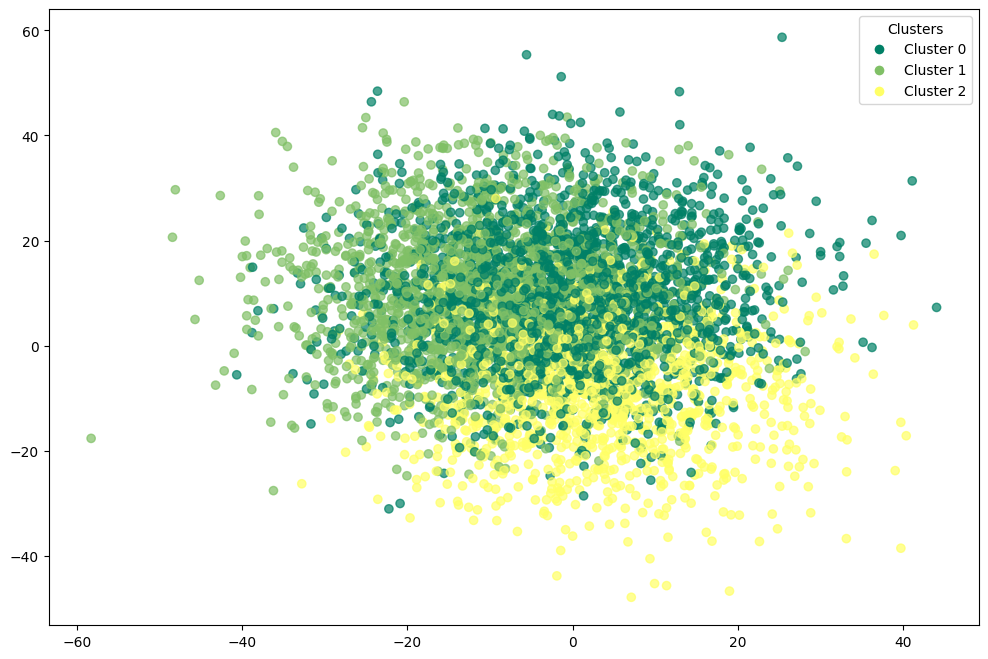

In [13191]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13192]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1585  729  186]
 [ 268  848  134]
 [ 135  165  950]]


In [13193]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.80      0.63      0.71      2500
           1       0.49      0.68      0.57      1250
           2       0.75      0.76      0.75      1250

    accuracy                           0.68      5000
   macro avg       0.68      0.69      0.68      5000
weighted avg       0.71      0.68      0.68      5000



In [13194]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.27918068014323094

In [13195]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.25836082836582

In [13196]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.08078306216208771

### spectral clustering with pca

In [13197]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13198]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13199]:
df_pca_spectral = corr_dataset.copy()

In [13200]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [13201]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,1
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,1
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,2
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13202]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.2064
accuracy after: 0.6654


In [13203]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_pca
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


In [13204]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1425  773  302]
 [ 198  869  183]
 [  76  141 1033]]


In [13205]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.84      0.57      0.68      2500
           1       0.49      0.70      0.57      1250
           2       0.68      0.83      0.75      1250

    accuracy                           0.67      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.67      0.67      5000



In [13206]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.26155080623421434

In [13207]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.259431910267576

In [13208]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.0849702970343406

### spectral clustering with t-SNE

In [13209]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13210]:
spectral_tsne.fit(X_tsne)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13211]:
df_tsne_spectral = corr_dataset.copy()

In [13212]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [13213]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,0
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,0
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,1
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,2
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,2
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,2
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,2


In [13214]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.1652
accuracy after: 0.6122


In [13215]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_tsne
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,0
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


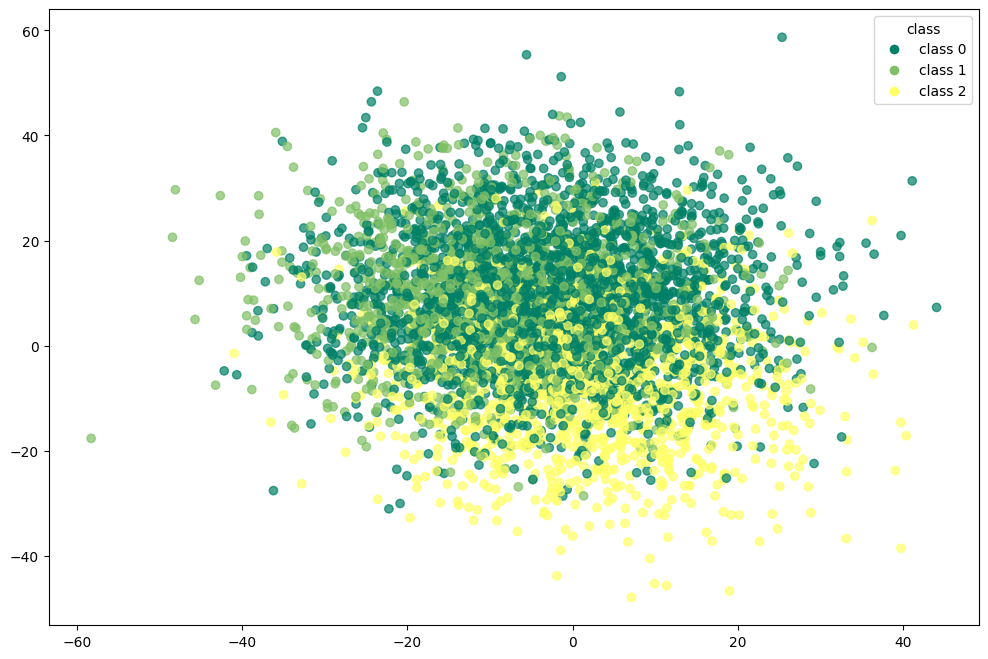

In [13216]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

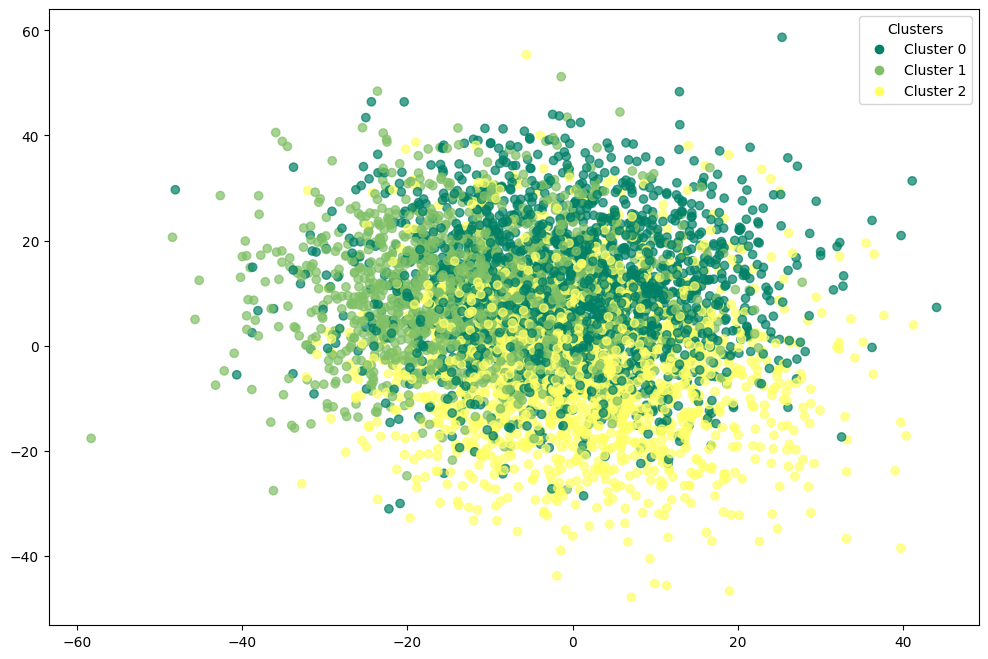

In [13217]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13218]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1410  704  386]
 [ 315  635  300]
 [ 109  125 1016]]


In [13219]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       0.77      0.56      0.65      2500
           1       0.43      0.51      0.47      1250
           2       0.60      0.81      0.69      1250

    accuracy                           0.61      5000
   macro avg       0.60      0.63      0.60      5000
weighted avg       0.64      0.61      0.61      5000



In [13220]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.19726312949284747

In [13221]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.1863511884561642

In [13222]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.05820388344025614

### spectral clustering with umap

In [13223]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13224]:
spectral_umap.fit(X_umap)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13225]:
df_umap_spectral = corr_dataset.copy()

In [13226]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [13227]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,0
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,0
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,1
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,0
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,0


In [13228]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.4128
accuracy after: 0.6424


In [13229]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,target,spectral_umap
0,-11.984228,2.313583,-4.515871,-3.888507,-3.395738,18.066025,-4.580833,12.778710,35.796045,-3.042458,1,2
1,5.205626,-3.253708,-0.193451,-7.114717,-17.209463,14.968002,-9.777369,-2.269157,10.149822,-13.950139,2,2
2,11.634537,-8.240988,5.876211,-13.956953,-11.700492,-19.691613,-2.342205,15.886849,15.114641,-8.801561,0,2
3,-12.883614,13.724218,30.687895,-27.163204,-2.426953,-5.926251,-27.208004,12.454007,-15.120218,7.981334,1,1
4,-24.017214,1.119268,26.611847,-16.221996,2.094522,-29.825627,0.494557,9.025117,8.741561,0.231724,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-19.614343,31.206421,8.819837,7.741884,-27.178393,-5.070249,-24.536448,-26.402349,-7.941918,11.642677,0,1
4996,23.404429,11.105151,13.985417,-9.533055,-17.041502,-27.258559,-0.158693,27.063537,3.058442,13.636400,0,0
4997,-10.290225,34.908137,2.633242,-11.303233,-11.451185,-0.811046,6.774475,1.893684,1.893152,-13.130585,1,1
4998,-21.873357,32.914180,20.754825,-5.440547,-4.710965,4.028664,-8.092152,21.680639,-28.562112,5.875432,0,1


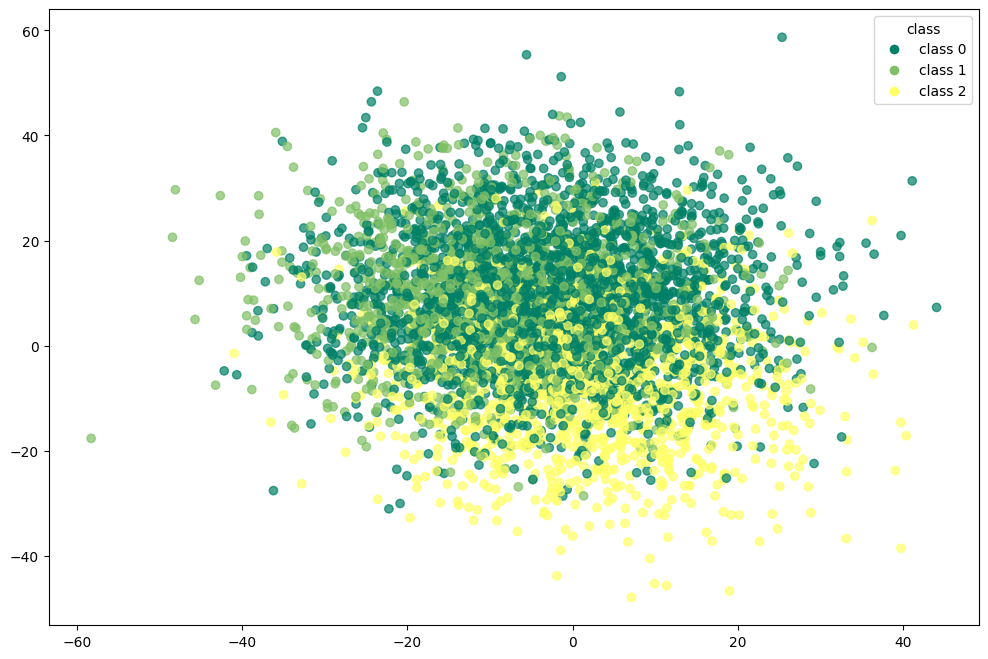

In [13230]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

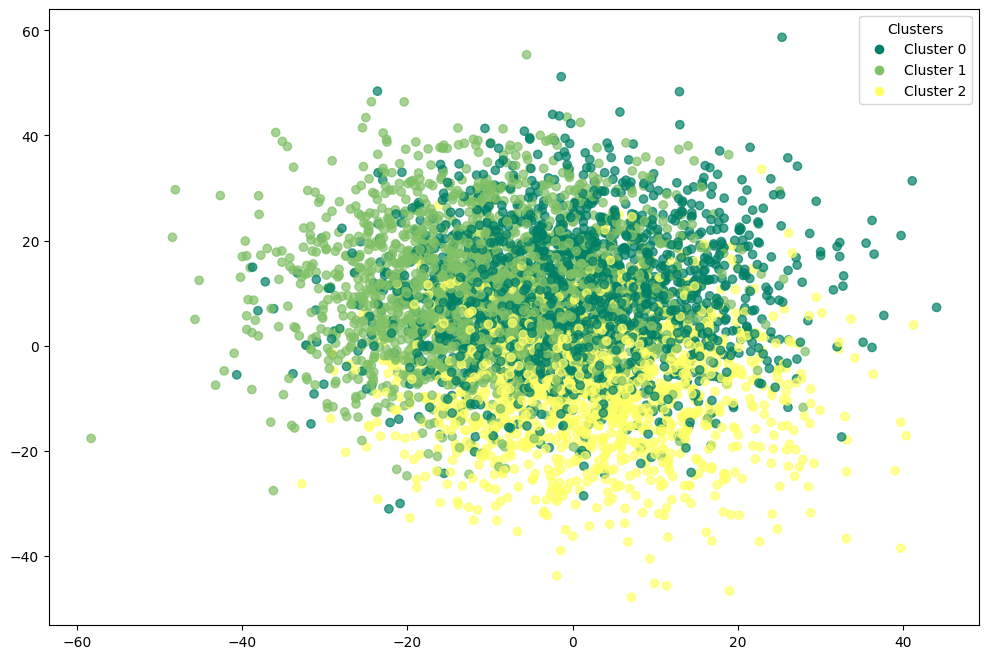

In [13231]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13232]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1416  859  225]
 [ 255  846  149]
 [ 139  161  950]]


In [13233]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       0.78      0.57      0.66      2500
           1       0.45      0.68      0.54      1250
           2       0.72      0.76      0.74      1250

    accuracy                           0.64      5000
   macro avg       0.65      0.67      0.65      5000
weighted avg       0.68      0.64      0.65      5000



In [13234]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.23490570394090488

In [13235]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.23030274742857712

In [13236]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.07356469159594278

# accuracy and confusion matrix 

## k-means

In [13237]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.83      0.60      0.70      2500
           1       0.50      0.68      0.57      1250
           2       0.69      0.83      0.76      1250

    accuracy                           0.68      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.68      0.68      5000



In [13238]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1491  728  281]
 [ 221  845  184]
 [  77  130 1043]]


## k-menas + pca

In [13239]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.83      0.61      0.70      2500
           1       0.50      0.67      0.57      1250
           2       0.69      0.82      0.75      1250

    accuracy                           0.68      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.68      0.68      5000



In [13240]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1520  703  277]
 [ 230  833  187]
 [  89  130 1031]]


## k-means + t-SNE

In [13241]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.72      0.52      0.60      2500
           1       0.35      0.42      0.38      1250
           2       0.59      0.80      0.68      1250

    accuracy                           0.56      5000
   macro avg       0.55      0.58      0.55      5000
weighted avg       0.59      0.56      0.57      5000



In [13242]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1297  800  403]
 [ 429  526  295]
 [  80  174  996]]


## k-means + UMAP

In [13243]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.81      0.57      0.67      2500
           1       0.49      0.62      0.55      1250
           2       0.65      0.85      0.73      1250

    accuracy                           0.65      5000
   macro avg       0.65      0.68      0.65      5000
weighted avg       0.69      0.65      0.65      5000



In [13244]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1422  729  349]
 [ 241  780  229]
 [  93   98 1059]]


## Birch

In [13245]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.71      0.59      0.65      2500
           1       0.39      0.50      0.44      1250
           2       0.59      0.62      0.61      1250

    accuracy                           0.58      5000
   macro avg       0.56      0.57      0.56      5000
weighted avg       0.60      0.58      0.58      5000



In [13246]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[1482  677  341]
 [ 434  626  190]
 [ 166  307  777]]


## Birch + pca

In [13247]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.66      0.43      0.52      2500
           1       0.37      0.58      0.45      1250
           2       0.59      0.66      0.62      1250

    accuracy                           0.52      5000
   macro avg       0.54      0.56      0.53      5000
weighted avg       0.57      0.52      0.53      5000



In [13248]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[1066 1201  233]
 [ 177  723  350]
 [ 379   41  830]]


## Birch + t-SNE

In [13249]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.71      0.34      0.46      2500
           1       0.40      0.56      0.46      1250
           2       0.49      0.80      0.61      1250

    accuracy                           0.51      5000
   macro avg       0.53      0.57      0.51      5000
weighted avg       0.58      0.51      0.50      5000



In [13250]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[ 852  933  715]
 [ 226  696  328]
 [ 114  130 1006]]


## Birch + UMAP

In [13251]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       0.78      0.54      0.64      2500
           1       0.43      0.69      0.53      1250
           2       0.73      0.73      0.73      1250

    accuracy                           0.63      5000
   macro avg       0.65      0.66      0.63      5000
weighted avg       0.68      0.63      0.64      5000



In [13252]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[1357  938  205]
 [ 256  868  126]
 [ 133  205  912]]


## GMM

In [13253]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.71      0.52      0.60      2500
           1       0.41      0.15      0.22      1250
           2       0.42      0.90      0.57      1250

    accuracy                           0.52      5000
   macro avg       0.51      0.52      0.46      5000
weighted avg       0.56      0.52      0.50      5000



In [13254]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1310  213  977]
 [ 471  182  597]
 [  73   46 1131]]


## GMM + pca

In [13255]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.79      0.44      0.57      2500
           1       0.34      0.66      0.45      1250
           2       0.76      0.73      0.74      1250

    accuracy                           0.57      5000
   macro avg       0.63      0.61      0.59      5000
weighted avg       0.67      0.57      0.58      5000



In [13256]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1101 1265  134]
 [ 281  820  149]
 [  11  330  909]]


## GMM + t-SNE

In [13257]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.73      0.39      0.51      2500
           1       0.34      0.53      0.42      1250
           2       0.50      0.71      0.59      1250

    accuracy                           0.50      5000
   macro avg       0.53      0.54      0.50      5000
weighted avg       0.58      0.50      0.50      5000



In [13258]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[966 921 613]
 [329 659 262]
 [ 24 335 891]]


## GMM + UMAP

In [13259]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.77      0.53      0.63      2500
           1       0.38      0.64      0.48      1250
           2       0.47      0.44      0.46      1250

    accuracy                           0.54      5000
   macro avg       0.54      0.54      0.52      5000
weighted avg       0.60      0.54      0.55      5000



In [13260]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1329  641  530]
 [ 349  805   96]
 [  38  658  554]]


## PAM

In [13261]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1235  824  441]
 [ 318  722  210]
 [  39  259  952]]


In [13262]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.78      0.49      0.60      2500
           1       0.40      0.58      0.47      1250
           2       0.59      0.76      0.67      1250

    accuracy                           0.58      5000
   macro avg       0.59      0.61      0.58      5000
weighted avg       0.64      0.58      0.59      5000



## PAM + pca

In [13263]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1505  704  291]
 [ 232  832  186]
 [  81  134 1035]]


In [13264]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.83      0.60      0.70      2500
           1       0.50      0.67      0.57      1250
           2       0.68      0.83      0.75      1250

    accuracy                           0.67      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.67      0.68      5000



## PAM + t-SNE

In [13265]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1347  727  426]
 [ 228  737  285]
 [  82  146 1022]]


In [13266]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.81      0.54      0.65      2500
           1       0.46      0.59      0.52      1250
           2       0.59      0.82      0.69      1250

    accuracy                           0.62      5000
   macro avg       0.62      0.65      0.62      5000
weighted avg       0.67      0.62      0.62      5000



## PAM + umap

In [13267]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1367  816  317]
 [ 222  784  244]
 [ 113   84 1053]]


In [13268]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.80      0.55      0.65      2500
           1       0.47      0.63      0.53      1250
           2       0.65      0.84      0.74      1250

    accuracy                           0.64      5000
   macro avg       0.64      0.67      0.64      5000
weighted avg       0.68      0.64      0.64      5000



## spectral clustering

In [13269]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1585  729  186]
 [ 268  848  134]
 [ 135  165  950]]


In [13270]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.80      0.63      0.71      2500
           1       0.49      0.68      0.57      1250
           2       0.75      0.76      0.75      1250

    accuracy                           0.68      5000
   macro avg       0.68      0.69      0.68      5000
weighted avg       0.71      0.68      0.68      5000



## spectral clustering + pca

In [13271]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1425  773  302]
 [ 198  869  183]
 [  76  141 1033]]


In [13272]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.84      0.57      0.68      2500
           1       0.49      0.70      0.57      1250
           2       0.68      0.83      0.75      1250

    accuracy                           0.67      5000
   macro avg       0.67      0.70      0.67      5000
weighted avg       0.71      0.67      0.67      5000



## spectral clustering + t-SNE

In [13273]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1410  704  386]
 [ 315  635  300]
 [ 109  125 1016]]


In [13274]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       0.77      0.56      0.65      2500
           1       0.43      0.51      0.47      1250
           2       0.60      0.81      0.69      1250

    accuracy                           0.61      5000
   macro avg       0.60      0.63      0.60      5000
weighted avg       0.64      0.61      0.61      5000



## spectral clustering + umap

In [13275]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1416  859  225]
 [ 255  846  149]
 [ 139  161  950]]


In [13276]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       0.78      0.57      0.66      2500
           1       0.45      0.68      0.54      1250
           2       0.72      0.76      0.74      1250

    accuracy                           0.64      5000
   macro avg       0.65      0.67      0.65      5000
weighted avg       0.68      0.64      0.65      5000



# external measures  

## k-means

In [13277]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [13278]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.279
NMI: 0.268
Silhouette: 0.086


## k-means + pca

In [13279]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [13280]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.279
NMI: 0.264
Silhouette: 0.085


## k-means + tsne

In [13281]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [13282]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.160
NMI: 0.159
Silhouette: 0.061


## k-means + umap

In [13283]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [13284]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.245
NMI: 0.240
Silhouette: 0.076


##  Birch 

In [13285]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [13286]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.151
NMI: 0.128
Silhouette: 0.042


## Birch + pca

In [13287]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [13288]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.167
NMI: 0.185
Silhouette: 0.075


## Birch + tsne

In [13289]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [13290]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.091
NMI: 0.118
Silhouette: 0.039


## Birch + umap

In [13291]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [13292]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.217
NMI: 0.221
Silhouette: 0.069


## GMM

In [13293]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [13294]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.084
NMI: 0.114
Silhouette: 0.061


## GMM + pca

In [13295]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [13296]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.187
NMI: 0.235
Silhouette: 0.057


## GMM + tsne

In [13297]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [13298]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.083
NMI: 0.118
Silhouette: 0.051


## GMM + umap

In [13299]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [13300]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.119
NMI: 0.147
Silhouette: 0.058


## pam

In [13301]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [13302]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.157
NMI: 0.173
Silhouette: 0.074


## pam + pca

In [13303]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [13304]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.275
NMI: 0.262
Silhouette: 0.085


## pam + tsne

In [13305]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [13306]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.200
NMI: 0.199
Silhouette: 0.062


## pca + umap

In [13307]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [13308]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.237
NMI: 0.238
Silhouette: 0.075


## spectral clustering

In [13309]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [13310]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.279
NMI: 0.258
Silhouette: 0.081


## spectral clustering + pca

In [13311]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [13312]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.262
NMI: 0.259
Silhouette: 0.085


## spectral clustering + tsne

In [13313]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [13314]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.197
NMI: 0.186
Silhouette: 0.058


## spectral clustering + umap

In [13315]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [13316]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.235
NMI: 0.230
Silhouette: 0.074


# final output

In [13317]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.279  0.268       0.086
k-means + pca               0.279  0.264       0.085
k-means + tsne              0.160  0.159       0.061
k-means + umap              0.245  0.240       0.076
Birch                       0.151  0.128       0.042
Birch + pca                 0.167  0.185       0.075
Birch + tsne                0.091  0.118       0.039
Birch + umap                0.217  0.221       0.069
GMM                         0.084  0.114       0.061
GMM + pca                   0.187  0.235       0.057
GMM + tsne                  0.083  0.118       0.051
GMM + umap                  0.119  0.147       0.058
PAM                         0.157  0.173       0.074
PAM + pca                   0.275  0.262       0.085
PAM + tsne                  0.200  0.199       0.062
PAM + umap                  0.237  0.238       0.075
Spectral Clustering         0.279  0.258       0.081
Spectral Clustering + pca   0.262  0.259      

In [13318]:
if N_SAMPLE == 2500 and N_FEATURES == 15:
    folder = "2500_15"
elif N_SAMPLE == 5000 and N_FEATURES == 10:
    folder = "5000_10"
elif N_SAMPLE == 10000 and N_FEATURES == 5:
    folder = "10000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

In [13319]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_12.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13320]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13321]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13322]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [13323]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_12.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13324]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13325]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13326]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [13327]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_12.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13328]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13329]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [13330]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [13331]:
dfs = {}

In [13332]:
dfs[f"df_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 12.5'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 10'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 7.5'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 12.5'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 10'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 7.5'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 12.5'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 10'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 7.5'):df_7_cluster['ARI'].values,
        }
)

## final dataset

In [13333]:
dfs[f"df_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [13334]:
dfs[f"df_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"df_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [13335]:
df_2500_15 = pd.read_csv("df_2500_15.csv", header=[0,1,2])

In [13336]:
df_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [13337]:
df_5000_10 = pd.read_csv("df_5000_10.csv", header=[0,1,2])

In [13338]:
df_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [13339]:
# df_10000_5 = pd.read_csv("df_10000_5.csv", header=[0,1,2])

In [13340]:
# df_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])